L'objectif de ce notebook est de mieux comprendre les données et analyses de l'article *Mutation dynamics and fitness effects followed in single cells*, par Lydia Robert, Jean Ollion, Jerome Robert, Xiaohu Song, Ivan Matic et Marina Elez (Science, 2018).

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Répliquer-l'analyse" data-toc-modified-id="Répliquer-l'analyse-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Répliquer l'analyse</a></span><ul class="toc-item"><li><span><a href="#Données-de-l'expérience-MA" data-toc-modified-id="Données-de-l'expérience-MA-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Données de l'expérience MA</a></span></li><li><span><a href="#Method-1-:-remove-channels-with-dead-cells" data-toc-modified-id="Method-1-:-remove-channels-with-dead-cells-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Method 1 : remove channels with dead cells</a></span><ul class="toc-item"><li><span><a href="#Deletion-of-slowly-growing/dead-cells" data-toc-modified-id="Deletion-of-slowly-growing/dead-cells-1.2.1"><span class="toc-item-num">1.2.1&nbsp;&nbsp;</span>Deletion of slowly growing/dead cells</a></span></li><li><span><a href="#Deletion-of-aberrant-values" data-toc-modified-id="Deletion-of-aberrant-values-1.2.2"><span class="toc-item-num">1.2.2&nbsp;&nbsp;</span>Deletion of aberrant values</a></span></li><li><span><a href="#Estimation-des-moments" data-toc-modified-id="Estimation-des-moments-1.2.3"><span class="toc-item-num">1.2.3&nbsp;&nbsp;</span>Estimation des moments</a></span></li></ul></li><li><span><a href="#Method-2-:-keep-channels-with-dead-cells" data-toc-modified-id="Method-2-:-keep-channels-with-dead-cells-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Method 2 : keep channels with dead cells</a></span><ul class="toc-item"><li><span><a href="#Deletion-of-slowly-growing/dead-cells" data-toc-modified-id="Deletion-of-slowly-growing/dead-cells-1.3.1"><span class="toc-item-num">1.3.1&nbsp;&nbsp;</span>Deletion of slowly growing/dead cells</a></span></li><li><span><a href="#Deletion-of-aberrant-values" data-toc-modified-id="Deletion-of-aberrant-values-1.3.2"><span class="toc-item-num">1.3.2&nbsp;&nbsp;</span>Deletion of aberrant values</a></span></li><li><span><a href="#Estimation-des-moments" data-toc-modified-id="Estimation-des-moments-1.3.3"><span class="toc-item-num">1.3.3&nbsp;&nbsp;</span>Estimation des moments</a></span></li></ul></li><li><span><a href="#Analyse-de-sensibilité" data-toc-modified-id="Analyse-de-sensibilité-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Analyse de sensibilité</a></span></li><li><span><a href="#Generations-:-cell-lengths-and-count" data-toc-modified-id="Generations-:-cell-lengths-and-count-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>Generations : cell lengths and count</a></span></li></ul></li><li><span><a href="#Test-des-méthodes-sur-les-données-simulées" data-toc-modified-id="Test-des-méthodes-sur-les-données-simulées-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Test des méthodes sur les données simulées</a></span><ul class="toc-item"><li><span><a href="#Fichiers-de-simulations" data-toc-modified-id="Fichiers-de-simulations-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Fichiers de simulations</a></span></li><li><span><a href="#Traitement-des-données-:-supprimer-canaux-avec-cellules-mortes" data-toc-modified-id="Traitement-des-données-:-supprimer-canaux-avec-cellules-mortes-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Traitement des données : supprimer canaux avec cellules mortes</a></span><ul class="toc-item"><li><span><a href="#Deletion-of-slowly-growing/dead-cells" data-toc-modified-id="Deletion-of-slowly-growing/dead-cells-2.2.1"><span class="toc-item-num">2.2.1&nbsp;&nbsp;</span>Deletion of slowly growing/dead cells</a></span></li><li><span><a href="#Deletion-of-aberrant-values" data-toc-modified-id="Deletion-of-aberrant-values-2.2.2"><span class="toc-item-num">2.2.2&nbsp;&nbsp;</span>Deletion of aberrant values</a></span></li><li><span><a href="#Moments-estimation" data-toc-modified-id="Moments-estimation-2.2.3"><span class="toc-item-num">2.2.3&nbsp;&nbsp;</span>Moments estimation</a></span></li></ul></li></ul></li></ul></div>

# Répliquer l'analyse

In [12]:
library("gridExtra")
library("ggplot2")
library("zoo")
library("MASS")

## Données de l'expérience MA

On se base sur les données fournies en annexe de l'article, ainsi que leur description.

The folder contains 4 files giving the evolution of growth rate during one representative $\mu$MA experiment for 4 different strains, *mutH*, *mutT*, WT, MF1 (dataset_microMA_...) . Each column contains the values of one variable (time, generation or growth rate) for each time step for the mother cell of a single microchannel. The first two rows (i.e. first two values for each column) give respectively the index of the field of view and the index of the microchannel (~15channels for each field of view).

In [13]:
microMA_WT <- read.csv2("Donnees_article/All_data/data_microMA/dataset_microMA_WT.csv")
microMA_MutH <- read.csv2("Donnees_article/All_data/data_microMA/dataset_microMA_MutH.csv")
microMA_MF1 <- read.csv2("Donnees_article/All_data/data_microMA/dataset_microMA_MF1.csv")
microMA_MutT <- read.csv2("Donnees_article/All_data/data_microMA/dataset_microMA_MutT.csv")

# Split the channel information (first 2 rows) from the growth rates
microMA_WT_channels <- microMA_WT[c(1,2),]
microMA_WT <- microMA_WT[-c(1,2),]
microMA_MutH_channels <- microMA_MutH[c(1,2),]
microMA_MutH <- microMA_MutH[-c(1,2),]
microMA_MF1_channels <- microMA_MF1[c(1,2),]
microMA_MF1 <- microMA_MF1[-c(1,2),]
microMA_MutT_channels <- microMA_MutT[c(1,2),]
microMA_MutT <- microMA_MutT[-c(1,2),]

In [14]:
tail(microMA_MutH[,1:9], 10)

,time,generation,growth.rate,time.1,generation.1,growth.rate.1,time.2,generation.2,growth.rate.2
,<int>,<int>,<dbl>,<int>,<int>,<dbl>,<int>,<int>,<dbl>
993,3960,182,0.02770213,3960,121,0.01443289,3960,163,0.001285689
994,3964,182,0.02770213,3964,121,0.01443289,3964,163,0.001285689
995,3968,182,0.02770213,3968,122,0.01675265,3968,164,0.026031184
996,3972,182,0.02770213,3972,122,0.01675265,3972,164,0.026031184
997,3976,182,0.02770213,3976,122,0.01675265,3976,164,0.026031184
998,3980,183,0.02867049,3980,122,0.01675265,3980,164,0.026031184
999,3984,183,0.02867049,3984,122,0.01675265,3984,165,0.025671465
1000,3988,183,0.02867049,3988,122,0.01675265,3988,165,0.025671465
1001,3992,183,0.02867049,3992,122,0.01675265,3992,165,0.025671465


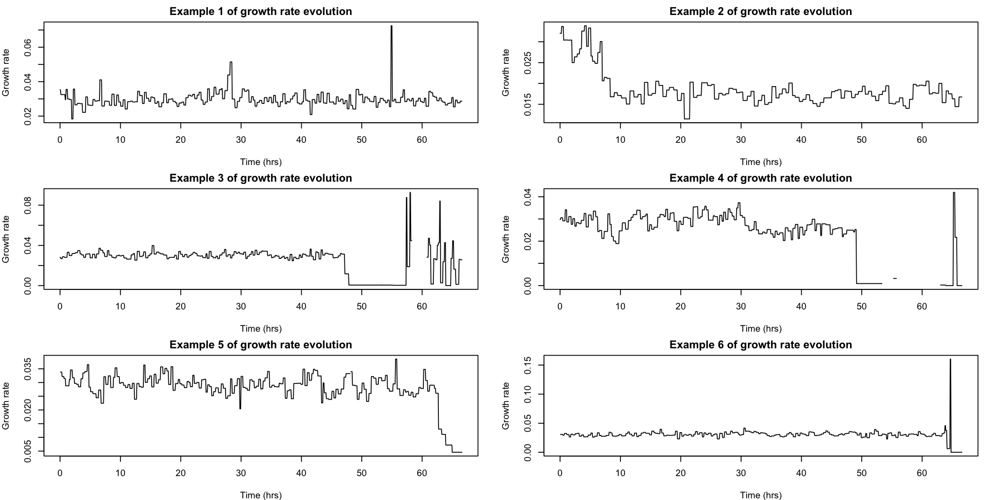

In [15]:
#png("Img/Growth_rates_examples.png", width = 800, height = 400)

microMA_MutH_growthRates <- microMA_MutH[seq(3, dim(microMA_MutH)[2], 3)]
microMA_MutH_growthRates[microMA_MutH_growthRates<0] <- NA  # Set negative growth rates to NA

microMA_WT_growthRates <- microMA_WT[seq(3, dim(microMA_WT)[2], 3)]
microMA_WT_growthRates[microMA_WT_growthRates<0] <- NA  # Set negative growth rates to NA

microMA_MutT_growthRates <- microMA_MutT[seq(3, dim(microMA_MutT)[2], 3)]
microMA_MutT_growthRates[microMA_MutT_growthRates<0] <- NA  # Set negative growth rates to NA

microMA_MF1_growthRates <- microMA_MF1[seq(3, dim(microMA_MF1)[2], 3)]
microMA_MF1_growthRates[microMA_MF1_growthRates<0] <- NA  # Set negative growth rates to NA


par(mfrow=c(3,2), mar = c(4, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 150)

for (i in 1:6){
    plot(microMA_MutH$time/60, microMA_MutH_growthRates[, i], type="l", xlab = "Time (hrs)", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
}

#dev.off()

## Method 1 : remove channels with dead cells

Full relevant text:

* The segmentation errors generated by image analysis can create aberrant, very low or high growth rates. Therefore, we filtered our data in the following way. For each channel and each generation, we calculated the median of the growth rates for earlier generations (M bef ore ) and subsequent generations (M af ter ). Growth rate estimates that are clearly aberrant (as confirmed by visual inspection of images) are either much larger than both M bef ore and M af ter or much smaller than both M bef ore and M af ter (Note that M bef ore and M af ter can be significantly different because of the occurrence of deleterious mutations). Therefore for each generation, we remove the value of the growth rate μ from the data if it di↵ers from both M af ter and M bef ore by more than a threshold value T. The value T was fixed at 30% of the average growth rate in the experiment, corresponding to the mean+/ 2standard deviation of the variable μ M af ter (or equivalently μ M bef ore ; both variables follow a distribution that is well approximated by a gaussian). The datasets for all strains (WT mutH, mutT, and MF1 such as plotted in Figure 3A and Figure S8) were all filtered using the same procedure. **was done afterwards**

* In order to eliminate any image analysis errors that could bias our results and would not have been removed by this filtering procedure, we selected all the channels where a growth rate smaller than 0.015 was detected and systematically checked by visual inspection cell segmentation and tracking on all the images corresponding to this channel. Therefore, small growth rate values are all valid measurements. **Cannot be done**

* Death of slowly growing cells induces noise in DFE estimation (figure S14). Therefore, to estimate the DFE’s first moments (figure 3C and table S3) we used a subset of the data, restricted in time and containing only cells that do not die on this restricted time window (time points before 40 hours, only channels where the mother cell is still alive at 44 hours). For selecting such data we use an automatic procedure. If the growth rate of a cell is below 0.003 (10% of its initial value) during more than 80 minutes, the cell and its potential descendants are removed from the data. We checked that the results obtained through this automatic procedure are identical to those obtained when removing dead cells detected by visual inspection of the phase contrast images, as shown in table S8 for a representative mutH experiment. **Was done first**

### Deletion of slowly growing/dead cells
* Death of slowly growing cells induces noise in DFE estimation (figure S14). Therefore, to estimate the DFE’s first moments (figure 3C and table S3) we used a subset of the data, restricted in time and containing only cells that do not die on this restricted time window (time points before 40 hours, only channels where the mother cell is still alive at 44 hours). **For selecting such data we use an automatic procedure. If the growth rate of a cell is below 0.003 (10% of its initial value) during more than 80 minutes, the cell and its potential descendants are removed from the data**. We checked that the results obtained through this automatic procedure are identical to those obtained when removing dead cells detected by visual inspection of the phase contrast images, as shown in table S8 for a representative mutH experiment. 

In [16]:
tmin=1
tmax=44*15
threshold <- 0.003
keep_cells <- FALSE  # wether to keep early cells even if the mother cell dies later on

first_slow_cell <- function(x, threshold){
    return (min(which(x<threshold), na.rm=T))
}

remove_NA_cols <- function(GR){
    return(GR[!sapply(GR, function(x)all(is.na(x)))])
}

remove_slow_GR <- function(GR, threshold, keep_cells, tmin, tmax, verbose=FALSE){
     # Identify channels with >80h of slow growth (dead mother cell)
     slow_channels <- which(colSums(GR[1:(tmax+20),]<threshold, na.rm=T)>20)
     
     if (keep_cells){
         d <- dim(GR[slow_channels])
         # Find the first slow growth rate time and set all following growth rates to NA
         first_slow_time <- sapply(GR[slow_channels], first_slow_cell, threshold)
         GR_to_remove <- sapply(first_slow_time, function(t){matrix(1:d[1], d) >= max(t-10, 0)})
         GR[slow_channels][GR_to_remove] <- NA
    }else if(length(slow_channels)!=0){
         GR <- GR[-slow_channels]
    }
    if (verbose){print(paste("slow_channels :", length(slow_channels))); print(dim(GR))}
    return (remove_NA_cols(GR[tmin:tmax,]))
 }

print("WT")
microMA_WT_growthRates_RMdead <- remove_slow_GR(microMA_WT_growthRates, threshold, keep_cells, tmin, tmax, verbose=T)

print("MutH")
microMA_MutH_growthRates_RMdead <- remove_slow_GR(microMA_MutH_growthRates, threshold, keep_cells, tmin, tmax, verbose=T)

print("MutT")
microMA_MutT_growthRates_RMdead <- remove_slow_GR(microMA_MutT_growthRates, threshold, keep_cells, tmin, tmax, verbose=T)

print("MF1")
microMA_MF1_growthRates_RMdead <- remove_slow_GR(microMA_MF1_growthRates, threshold, keep_cells, tmin, tmax, verbose=T)

[1] "WT"
[1] "slow_channels : 198"
[1]  999 1053
[1] "MutH"
[1] "slow_channels : 650"
[1] 1000  826
[1] "MutT"
[1] "slow_channels : 554"
[1] 946 873
[1] "MF1"
[1] "slow_channels : 659"
[1] 668 179


$\to$ **Cette mise au point supprime respectivement 16%/44%/39%/79% des cellules de WT/MutH/MutT/MF1. Est-ce que conditionner l'analyse à la survie des cellules au bout de l'expérience ne pourrait pas restreindre l'analyse à une population particulière de cellules ? Ou fausser l'analyse d'une autre manière ?**

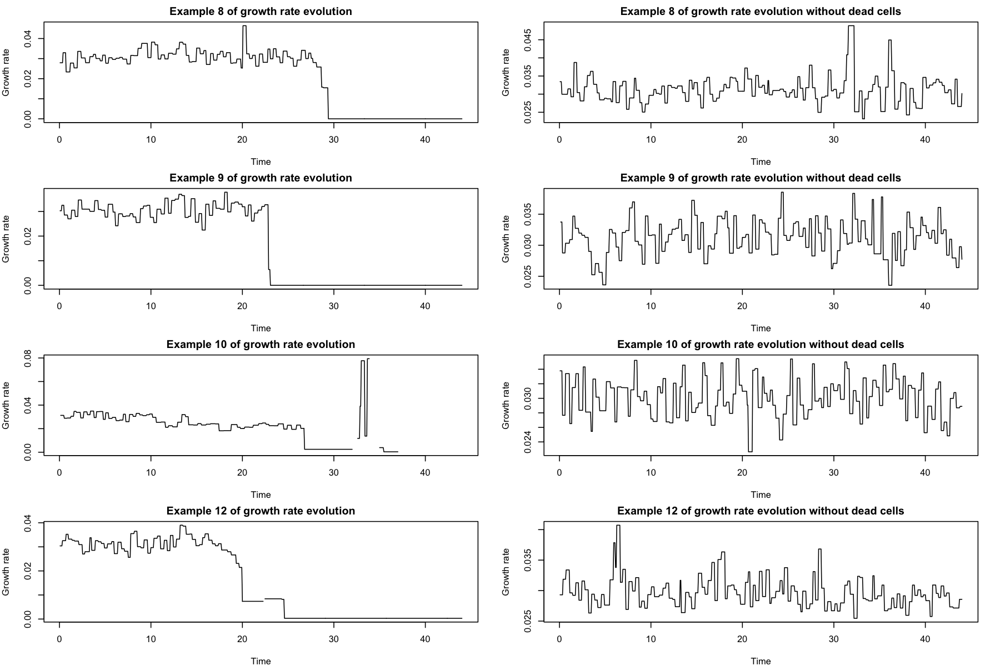

In [17]:
# Regardons quelques exemples :

par(mfrow=c(4,2), mar = c(4, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 8, repr.plot.res = 150)

for (i in c(8,9, 10,12)){
    plot(tmin:tmax*4/60, microMA_MutH_growthRates[tmin:tmax, i], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
    plot(tmin:tmax*4/60, microMA_MutH_growthRates_RMdead[,i], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution without dead cells"))
}

### Deletion of aberrant values

The segmentation errors generated by image analysis can create aberrant, very low or high growth rates. Therefore, we filtered our data in the following way. 

* For each channel and each generation, we **calculated the median of the growth rates for earlier generations (M bef ore ) and subsequent generations (M af ter )**. Growth rate estimates that are clearly aberrant (as confirmed by visual inspection of images) are either much larger than both M bef ore and M af ter or much smaller than both M bef ore and M af ter (Note that M bef ore and M af ter can be significantly different because of the occurrence of deleterious mutations). 

* **Therefore for each generation, we remove the value of the growth rate μ from the data if it di↵ers from both M af ter and M bef ore by more than a threshold value T. The value T was fixed at 30% of the average growth rate in the experiment**, corresponding to the mean+/ 2standard deviation of the variable μ M af ter (or equivalently μ M bef ore ; both variables follow a distribution that is well approximated by a gaussian). The datasets for all strains (WT mutH, mutT, and MF1 such as plotted in Figure 3A and Figure S8) were all filtered using the same procedure.


In [18]:
detect_aberrant_GR <- function(df, width){
    # Rolling medians with a kernel aligned to the left or the right to each value
    M_before <- rollapply(df, width=width, median, align = 'right', na.rm = TRUE, fill = NA, partial = TRUE)
    M_after <- rollapply(df, width=width, median, align = 'left', na.rm = TRUE, fill = NA, partial = TRUE)
    
    # Replace the 30 first or last medians when they cannot be computed correctly
    first_GRs <- sapply(df, function(X){1:length(X) %in% head(which(!is.na(X)), 30)})
    last_GRs <- sapply(df, function(X){1:length(X) %in% tail(which(!is.na(X)), 30)})

    M_before[first_GRs] <- M_after[first_GRs][1]
    M_after[last_GRs] <- M_before[last_GRs][30]
    
    # Threshold = mean growth rate (for non-zero values)
    T <- 0.3*colMeans(df, na.rm=TRUE)

    return(t((t(df - M_before) > T & t(df - M_after) > T)|(t(df - M_before) < -T & t(df - M_after) < -T)))
}

remove_NA_cols <- function(GR){
    return(GR[!sapply(GR, function(x)all(is.na(x)))])
}

width=101

microMA_WT_growthRates_RMdead_NAab <- microMA_WT_growthRates_RMdead
microMA_WT_growthRates_RMdead_NAab[detect_aberrant_GR(microMA_WT_growthRates_RMdead_NAab, width)] <- NA
microMA_WT_growthRates_RMdead_NAab <- remove_NA_cols(microMA_WT_growthRates_RMdead_NAab)

microMA_MutH_growthRates_RMdead_NAab <- microMA_MutH_growthRates_RMdead
microMA_MutH_growthRates_RMdead_NAab[detect_aberrant_GR(microMA_MutH_growthRates_RMdead_NAab, width)] <- NA
microMA_MutH_growthRates_RMdead_NAab <- remove_NA_cols(microMA_MutH_growthRates_RMdead_NAab)

microMA_MutT_growthRates_RMdead_NAab <- microMA_MutT_growthRates_RMdead
microMA_MutT_growthRates_RMdead_NAab[detect_aberrant_GR(microMA_MutT_growthRates_RMdead_NAab, width)] <- NA
microMA_MutT_growthRates_RMdead_NAab <- remove_NA_cols(microMA_MutT_growthRates_RMdead_NAab)

microMA_MF1_growthRates_RMdead_NAab <- microMA_MF1_growthRates_RMdead
microMA_MF1_growthRates_RMdead_NAab[detect_aberrant_GR(microMA_MF1_growthRates_RMdead_NAab, width)] <- NA
microMA_MF1_growthRates_RMdead_NAab <- remove_NA_cols(microMA_MF1_growthRates_RMdead_NAab)

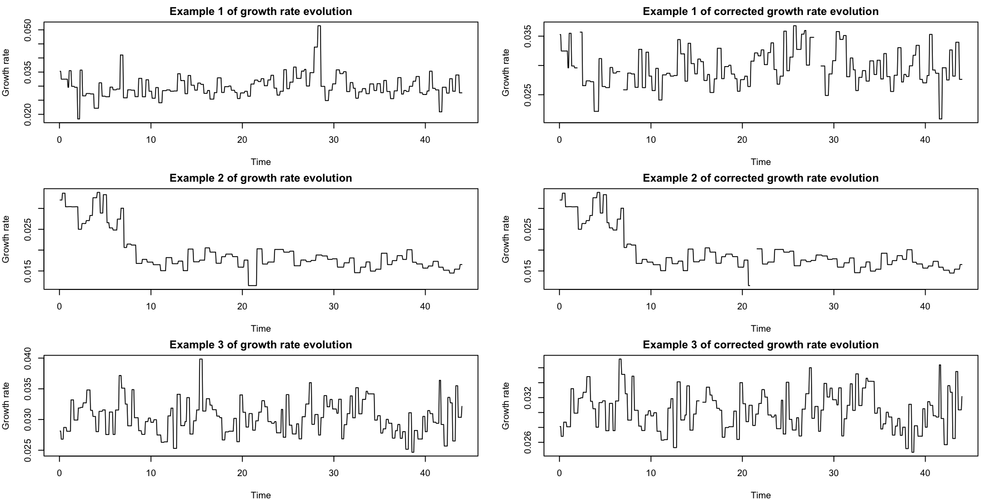

In [19]:
# Let us look at some examples:

par(mfrow=c(3,2), mar = c(4, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 150)

for (i in 1:3){
    plot(tmin:tmax*4/60, microMA_MutH_growthRates_RMdead[, i], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
    plot(tmin:tmax*4/60, microMA_MutH_growthRates_RMdead_NAab[, i], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of corrected growth rate evolution"))
}

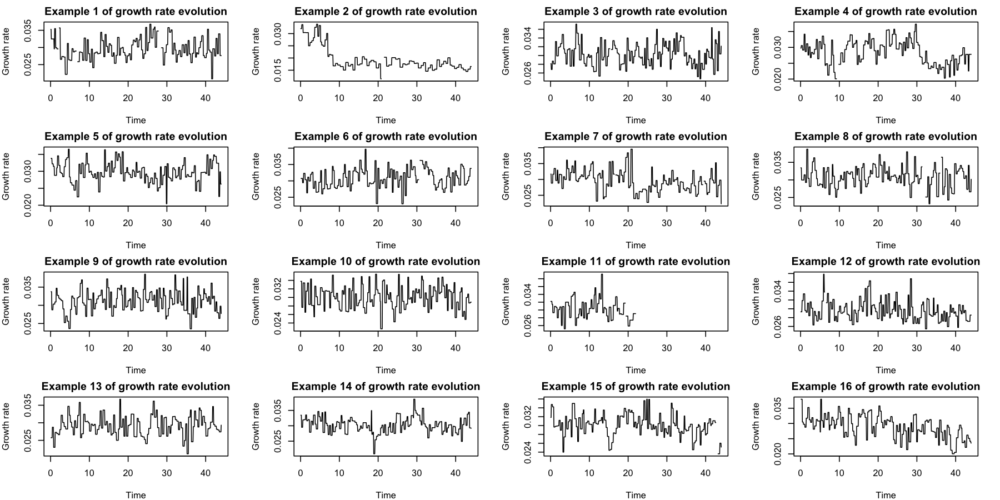

In [20]:
# Regardons quelques exemples :

par(mfrow=c(4,4), mar = c(4, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 150)

for (i in 1:16){
    plot(tmin:tmax*4/60,microMA_MutH_growthRates_RMdead_NAab[tmin:tmax, i], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
}

In [21]:
write.csv2(microMA_WT_growthRates_RMdead_NAab, "Donnees_article_modifiees/data_microMA/dataset_microMA_WT_growthRates_RMdead_NAab.csv")
write.csv2(microMA_MutH_growthRates_RMdead_NAab, "Donnees_article_modifiees/data_microMA/dataset_microMA_MutH_growthRates_RMdead_NAab.csv")
write.csv2(microMA_MutT_growthRates_RMdead_NAab, "Donnees_article_modifiees/data_microMA/dataset_microMA_MutT_growthRates_RMdead_NAab.csv")
write.csv2(microMA_MF1_growthRates_RMdead_NAab, "Donnees_article_modifiees/data_microMA/dataset_microMA_MF1_growthRates_RMdead_NAab.csv")

### Estimation des moments

In [22]:
microMA_WT_growthRates_RMdead_NAab <- read.csv2("Donnees_article_modifiees/data_microMA/dataset_microMA_WT_growthRates_RMdead_NAab.csv", row.names = 1)
microMA_MutH_growthRates_RMdead_NAab <- read.csv2("Donnees_article_modifiees/data_microMA/dataset_microMA_MutH_growthRates_RMdead_NAab.csv", row.names = 1)
microMA_MutT_growthRates_RMdead_NAab <- read.csv2("Donnees_article_modifiees/data_microMA/dataset_microMA_MutT_growthRates_RMdead_NAab.csv", row.names = 1)
microMA_MF1_growthRates_RMdead_NAab <- read.csv2("Donnees_article_modifiees/data_microMA/dataset_microMA_MF1_growthRates_RMdead_NAab.csv", row.names = 1)

In [23]:
moment_expectation <- function(k, dataset){
  return (rowMeans(dataset**k, na.rm = T))
}

log_choose <- function(k, n, moments_expectations){
  return ((-1)**k*choose(n,k)*log(moments_expectations[,k]))
}

k_values=1:10
moments_expectations_clean_MutH <- data.frame(sapply(k_values, 
                                                     moment_expectation, 
                                                     dataset=microMA_MutH_growthRates_RMdead_NAab))
names(moments_expectations_clean_MutH) <- paste("k.", k_values, sep = "")

moments_expectations_clean_WT <- data.frame(sapply(k_values, 
                                                   moment_expectation, 
                                                   dataset=microMA_WT_growthRates_RMdead_NAab))
names(moments_expectations_clean_WT) <- paste("k.", k_values, sep = "")

moments_expectations_clean_MutT <- data.frame(sapply(k_values, 
                                                     moment_expectation, 
                                                     dataset=microMA_MutT_growthRates_RMdead_NAab))
names(moments_expectations_clean_MutT) <- paste("k.", k_values, sep = "")

moments_expectations_clean_MF1 <- data.frame(sapply(k_values, 
                                                    moment_expectation, 
                                                    dataset=microMA_MF1_growthRates_RMdead_NAab))
names(moments_expectations_clean_MF1) <- paste("k.", k_values, sep = "")

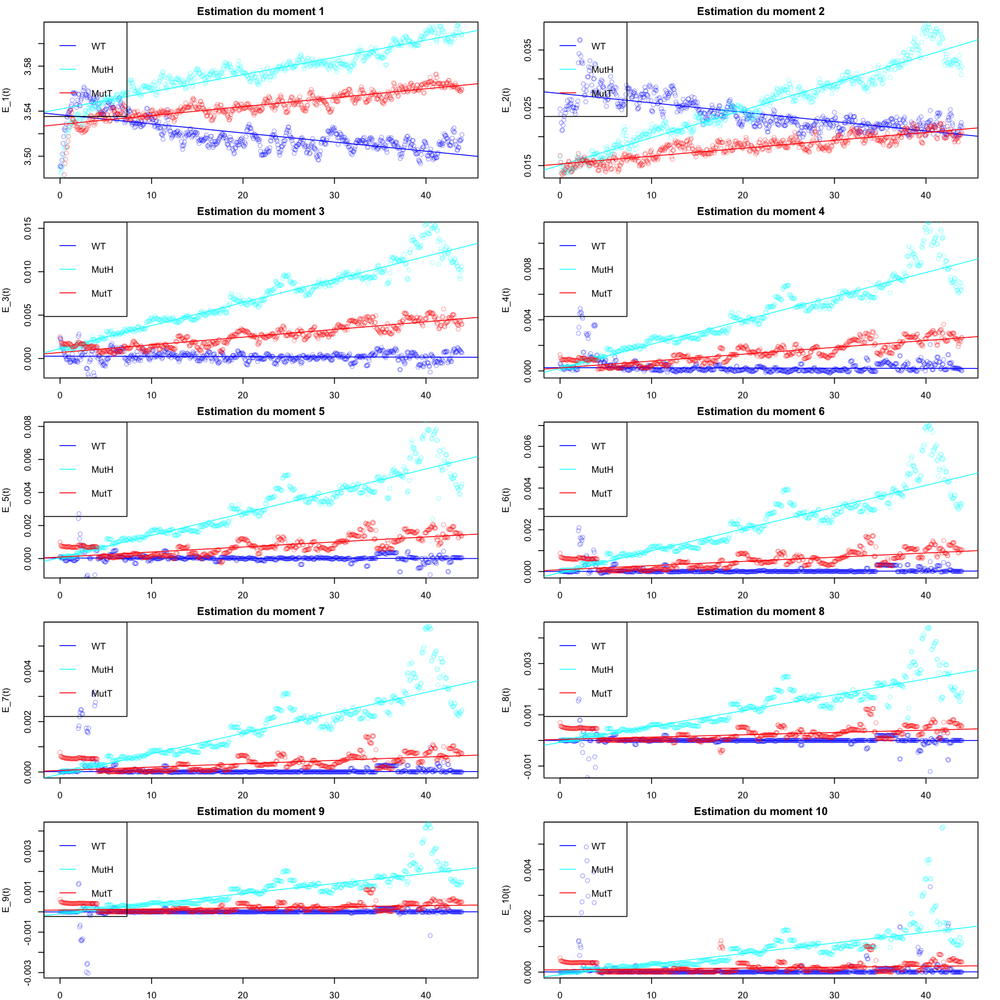

In [24]:
time_window=tmin:tmax
par(mfrow = c(5,2), mar = c(2, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 150)

N <- 10
slopes <- data.frame(n = 1:N, 
                     slope_MutH = rep(NA,N),
                     slope_MutT = rep(NA,N), 
                     slope_MF1 = rep(NA,N),
                     slope_WT = rep(NA,N))

for (n in 1:N){
    df_n <- data.frame(time = microMA_MutH[time_window,]$time/60,
                       E_nt_MutH = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MutH[time_window,])),
                       E_nt_MutT = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MutT[time_window,])),
                       E_nt_WT = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_WT[time_window,])))
    
    
    ### WT
    plot(x = df_n$time, 
         y = df_n$E_nt_WT, 
         xlab = "Time (hr)",
         ylab = paste("E_", n, "(t)", sep = ""),
         col = alpha("blue", 0.3),
         main = paste("Estimation du moment", n),
         ylim = quantile(df_n[,c("E_nt_WT", "E_nt_MutH", "E_nt_MutT")], c(0.005, 0.995), na.rm=T))
    
    lin_reg_WT <- rlm(E_nt_WT~time, data=df_n)
    abline(lin_reg_WT, col="blue", lwd=1)
    #slopes[n,7:11] <- c(summary(lin_reg_WT)$coefficients[2,c(1,2)]/60, summary(lin_reg_WT)$r.squared, mean(abs(resid(lin_reg_WT))), sqrt(mean(resid(lin_reg_WT)**2)))
    slopes$slope_WT[n] <- c(summary(lin_reg_WT)$coefficients[2,c(1)]/60)
    
    
    
    ### MutH
    points(x = df_n$time, 
           y = df_n$E_nt_MutH, 
           col = alpha("cyan", 0.3))
    
    lin_reg_MutH <- rlm(E_nt_MutH~time, data=df_n)
    abline(lin_reg_MutH, col="cyan", lwd=1)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MutH[n] <- c(summary(lin_reg_MutH)$coefficients[2,c(1)]/60)
    
        
    ### MutT
    points(x = df_n$time, 
           y = df_n$E_nt_MutT,
           col = alpha("red", 0.3))
    
    lin_reg_MutT <- rlm(E_nt_MutT~time, data=df_n)
    abline(lin_reg_MutT, col="red", lwd=1)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MutT[n] <- c(summary(lin_reg_MutT)$coefficients[2,c(1)]/60)
    
    
    legend("topleft", legend = c("WT", "MutH", "MutT"), col=c("blue", "cyan", "red"), lty=1, seg.len = 1, text.width=3)
    
}

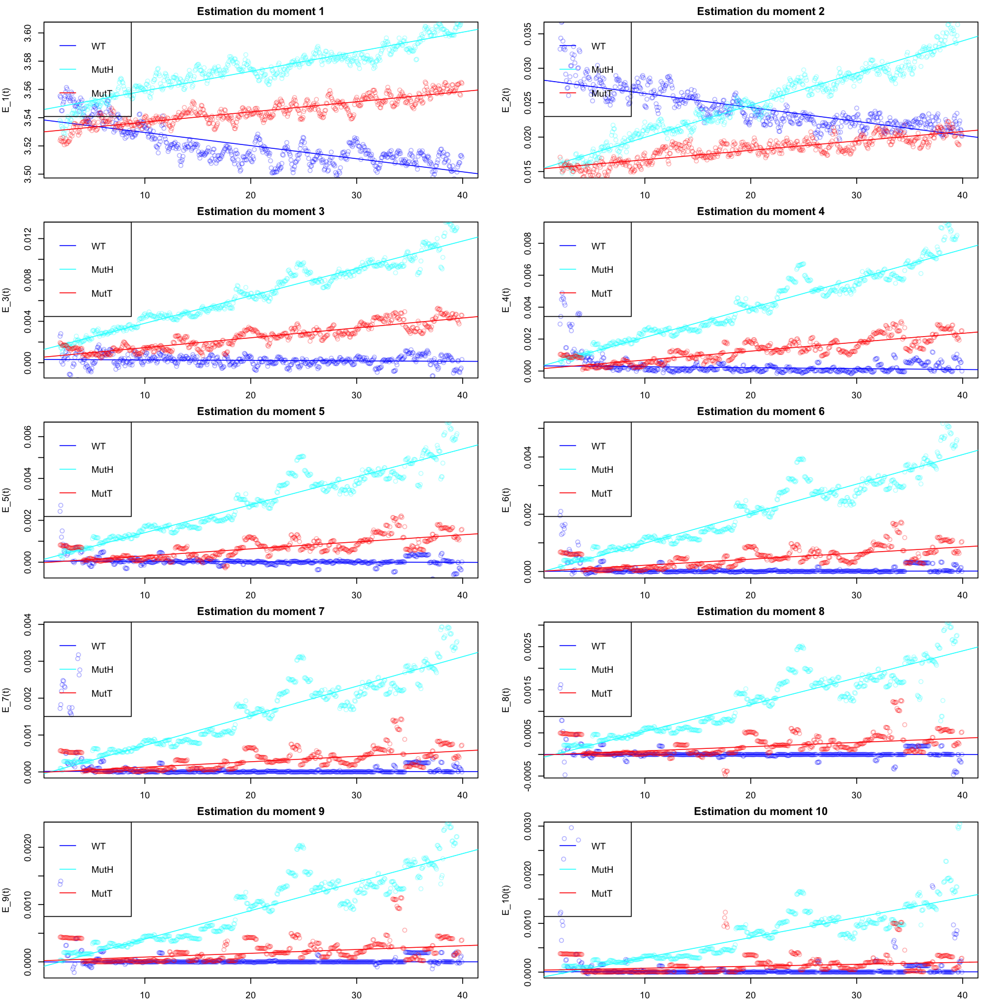

In [25]:
time_window=(tmin+2*15):(tmax-4*15)
par(mfrow = c(5,2), mar = c(2, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 150)

N <- 10
#slopes <- data.frame(n = 1:N,
#                     slope_MutH = rep(NA,N), std_err_MutH = rep(NA,N), r2_MutH = rep(NA,N), resid_L1_MutH = rep(NA,N), resid_L2_MutH = rep(NA,N), 
#                     slope_WT = rep(NA,N), std_err_WT = rep(NA,N), r2_WT = rep(NA,N), resid_L1_WT = rep(NA,N), resid_L2_WT = rep(NA,N))
slopes <- data.frame(n = 1:N, 
                    slope_MutH = rep(NA,N),
                    slope_MutT = rep(NA,N), 
                    slope_MF1 = rep(NA,N),
                    slope_WT = rep(NA,N))

for (n in 1:N){
    df_n <- data.frame(time = microMA_MutH[time_window,]$time/60,
                     E_nt_MutH = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MutH[time_window,])),
                     E_nt_MutT = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MutT[time_window,])),
                     E_nt_WT = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_WT[time_window,])))
    
    
    ### WT
    plot(x = df_n$time, 
         y = df_n$E_nt_WT, 
         xlab = "Time (hr)",
         ylab = paste("E_", n, "(t)", sep = ""),
         col = alpha("blue", 0.3),
         main = paste("Estimation du moment", n),
         ylim = quantile(df_n[,c("E_nt_WT", "E_nt_MutH", "E_nt_MutT")], c(0.01, 0.99), na.rm=T))
    
    lin_reg_WT <- rlm(E_nt_WT~time, data=df_n)
    abline(lin_reg_WT, col="blue", lwd=1)
    #slopes[n,7:11] <- c(summary(lin_reg_WT)$coefficients[2,c(1,2)]/60, summary(lin_reg_WT)$r.squared, mean(abs(resid(lin_reg_WT))), sqrt(mean(resid(lin_reg_WT)**2)))
    slopes$slope_WT[n] <- c(summary(lin_reg_WT)$coefficients[2,c(1)]/60)
    
    
    
    ### MutH
    points(x = df_n$time, 
           y = df_n$E_nt_MutH, 
           col = alpha("cyan", 0.3))
    
    lin_reg_MutH <- rlm(E_nt_MutH~time, data=df_n)
    abline(lin_reg_MutH, col="cyan", lwd=1)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MutH[n] <- c(summary(lin_reg_MutH)$coefficients[2,c(1)]/60)
    
        
    ### MutT
    points(x = df_n$time, 
           y = df_n$E_nt_MutT,
           col = alpha("red", 0.3))
    
    lin_reg_MutT <- rlm(E_nt_MutT~time, data=df_n)
    abline(lin_reg_MutT, col="red", lwd=1)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MutT[n] <- c(summary(lin_reg_MutT)$coefficients[2,c(1)]/60)
    
    
    legend("topleft", legend = c("WT", "MutH", "MutT"), col=c("blue", "cyan", "red"), lty=1, seg.len = 1, text.width=3)
    
}

![](Img/Moments_estimation.png)

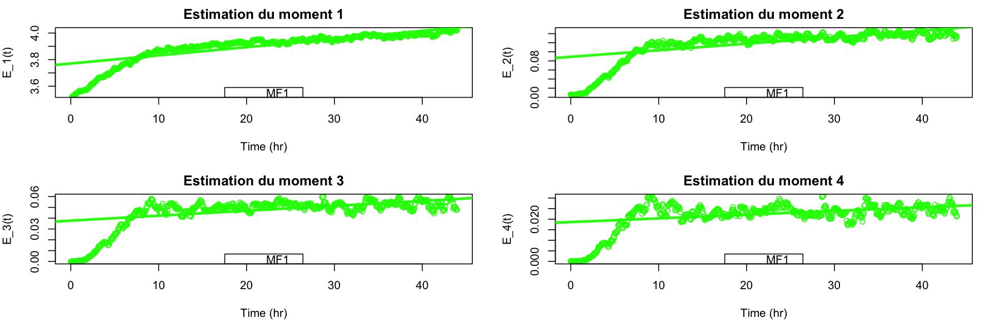

In [26]:
time_window=tmin:tmax
par(mfrow = c(2,2), mar = c(5, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 150)

for (n in 1:4){
    df_n <- data.frame(time = microMA_MutH[time_window,]$time/60,
                     E_nt_MF1 = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MF1[time_window,])))

    
    ### MF1
    plot(x = df_n$time, 
         y = df_n$E_nt_MF1,
         xlab = "Time (hr)",
         ylab = paste("E_", n, "(t)", sep = ""), 
         ylim = quantile(df_n$E_nt_MF1, c(0.01, 0.99), na.rm=T),
         col = "green",
         main = paste("Estimation du moment", n))
    
    lin_reg_MF1 <- rlm(E_nt_MF1~time, data=df_n)
    abline(lin_reg_MF1, col="green", lwd=3)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MF1[n] <- c(summary(lin_reg_MF1)$coefficients[2,c(1)]/60)

    
  legend("bottom", legend = c("MF1"), col=c("green"), seg.len = 1, text.width=3)
    
}

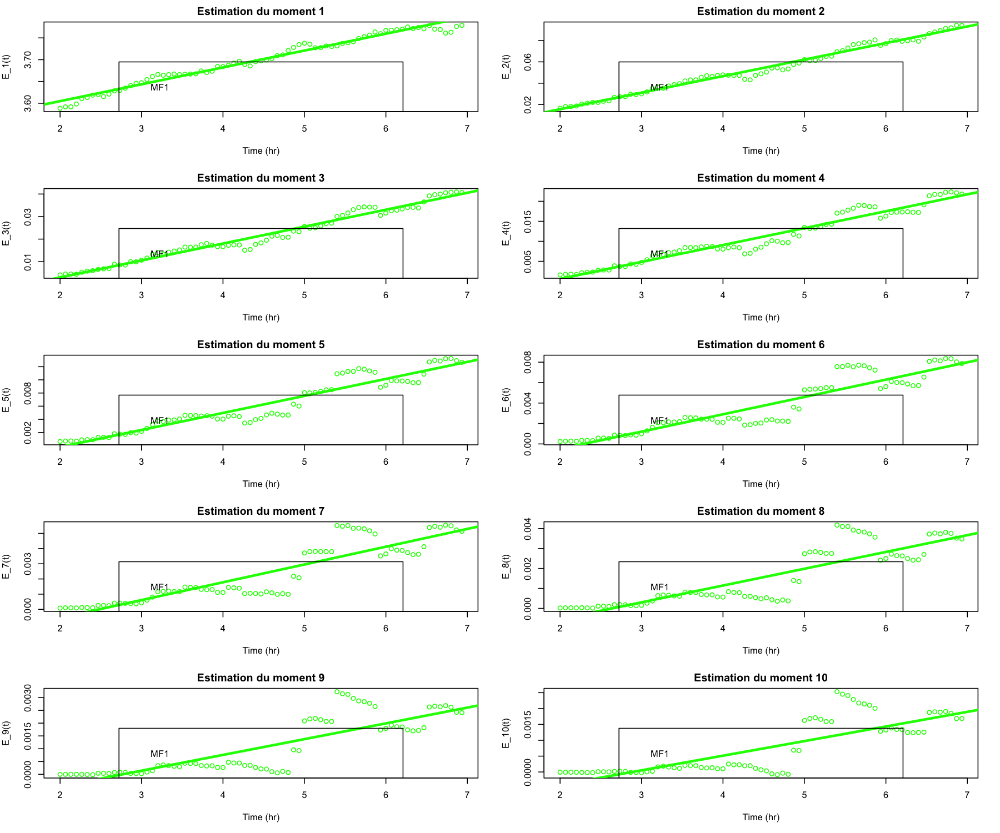

In [27]:
time_window=(tmin+2*15):(tmax-37*15)
par(mfrow = c(5,2), mar = c(5, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 10, repr.plot.res = 150)

for (n in 1:N){
    df_n <- data.frame(time = microMA_MutH[time_window,]$time/60,
                     E_nt_MF1 = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MF1[time_window,])))

    
    ### MF1
    plot(x = df_n$time, 
         y = df_n$E_nt_MF1,
         xlab = "Time (hr)",
         ylab = paste("E_", n, "(t)", sep = ""),
         col = "green",
         main = paste("Estimation du moment", n))
    
    lin_reg_MF1 <- rlm(E_nt_MF1~time, data=df_n)
    abline(lin_reg_MF1, col="green", lwd=3)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MF1[n] <- c(summary(lin_reg_MF1)$coefficients[2,c(1)]/60)

    
  legend("bottom", legend = c("MF1"), col=c("green"), seg.len = 1, text.width=3)
    
}

In [28]:
mult_factor = c(10**5, 10**6, 10**6, rep(10**7, 7))
cbind(slopes[1], mult_factor=mult_factor, signif(slopes[-1], digits=2)*mult_factor)

n,mult_factor,slope_MutH,slope_MutT,slope_MF1,slope_WT
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1e+05,2.3,1.20,64,-1.5000
2,1e+06,7.8,2.30,260,-3.4000
3,1e+06,4.4,1.60,130,-0.0760
4,1e+07,31.0,9.30,700,-0.9800
5,1e+07,22.0,5.60,430,-0.2700
6,1e+07,17.0,3.60,280,0.0360
7,1e+07,13.0,2.40,200,-0.0340
8,1e+07,10.0,1.60,140,-0.0150
9,1e+07,8.3,1.10,100,0.0093


 ![](Img/Slope_values.png)

*The slope of $En(t)$ is the product of the mutation rate with the nth moment of the DFE. For mutH,the mutation rate is determined from our MV experiments (=0.32/hr).The mutation rate for mutT and MF1 is estimated using classical genetic assays,giving 5.6/hr for MF1 and 0.37/hr formutT.*

*The slope of $En(t)$ is the product of the mutation rate with the nth moment of the DFE. For mutH $\lambda=0.0054\text{ min}^{-1}$, for mutT $\lambda=0.0063\text{ min}^{-1}$, for MF1 $\lambda=0.1\text{ min}^{-1}$, and for WT $\lambda=0.0000271\text{ min}^{-1}$*

In [29]:
DFE_moments <- slopes
names(DFE_moments) <- c("Order", "MutH", "MutT", "MF1", "WT")
DFE_moments$MutH <- DFE_moments$MutH/0.0054
DFE_moments$MutT <- DFE_moments$MutT/0.0063
DFE_moments$MF1 <- DFE_moments$MF1/0.1
DFE_moments$WT <- DFE_moments$WT/0.0000271
signif(DFE_moments, digits=2)

Order,MutH,MutT,MF1,WT
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.00430,1.9e-03,6.4e-03,-5.7e-01
2,0.00140,3.6e-04,2.6e-03,-1.2e-01
3,0.00082,2.5e-04,1.3e-03,-2.8e-03
4,0.00057,1.5e-04,7.0e-04,-3.6e-03
5,0.00041,8.9e-05,4.3e-04,-1.0e-03
6,0.00032,5.6e-05,2.8e-04,1.3e-04
7,0.00025,3.9e-05,2.0e-04,-1.3e-04
8,0.00019,2.6e-05,1.4e-04,-5.7e-05
9,0.00015,1.8e-05,1.0e-04,3.4e-05


Le moment centré d’ordre $r$ s’écrit à partir des moments ordinaires $m_i$ :

$$\mu_r = \sum_{i=0}^r C_r^i \, m_{r-i} \, (-m_1)^i = \sum_{i=0}^r C_r^i \, m_i \, (-m_1)^{r-i}$$

In [30]:
centeredMoments <- function(M){
    CM <- M
    M <- c(0,M)
    for (r in 1:length(CM)){
        CM[r] <- sum(sapply(0:r, function(i){choose(r,i)*M[r-i+1]*(-M[2])**i}))
    }
    return (CM)
}

DFE_centered_moments <- DFE_moments
names(DFE_centered_moments) <- c("Order", "MutH", "MutT", "MF1", "WT")
DFE_centered_moments$MutH <- centeredMoments(DFE_centered_moments$MutH)
DFE_centered_moments$MutT <- centeredMoments(DFE_centered_moments$MutT)
DFE_centered_moments$MF1 <- centeredMoments(DFE_centered_moments$MF1)
DFE_centered_moments$WT <- centeredMoments(DFE_centered_moments$WT)
signif(DFE_centered_moments, digits=2)

Order,MutH,MutT,MF1,WT
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.00430,1.9e-03,6.4e-03,-0.57
2,0.00140,3.5e-04,2.5e-03,-0.78
3,0.00080,2.5e-04,1.2e-03,-0.78
4,0.00055,1.5e-04,6.7e-04,-0.68
5,0.00040,8.8e-05,4.1e-04,-0.56
6,0.00031,5.5e-05,2.7e-04,-0.44
7,0.00024,3.8e-05,1.8e-04,-0.34
8,0.00018,2.5e-05,1.3e-04,-0.26
9,0.00015,1.7e-05,9.5e-05,-0.20


Le moment standardisé d’ordre $r$ s’écrit, à partir des moments centrés $\mu_r$ et de l'écart-type $\sigma$ : 

$$\tilde\mu_r = \frac{\mu_r}{\sigma^r}$$

In [31]:
sigma = sqrt(abs(DFE_moments[2,2:4]-DFE_moments[1,2:4]**2))
standardized_moments <- data.frame(t(sapply(1:10, function(i){DFE_centered_moments[i,2:4]/sigma**i})))
standardized_moments <- data.frame(Order=1:10,sapply(standardized_moments, as.numeric))
signif(standardized_moments, 2)

Order,MutH,MutT,MF1
<dbl>,<dbl>,<dbl>,<dbl>
1,1.1e-01,1.0e-01,1.3e-01
2,9.9e-01,9.9e-01,9.8e-01
3,1.5e+01,3.7e+01,9.4e+00
4,2.7e+02,1.1e+03,1.0e+02
5,5.2e+03,3.6e+04,1.2e+03
6,1.1e+05,1.2e+06,1.6e+04
7,2.2e+06,4.4e+07,2.2e+05
8,4.5e+07,1.5e+09,3.1e+06
9,9.4e+08,5.5e+10,4.5e+07


In [32]:
mu = DFE_moments[1,2:4]
CV = sigma/mu
skewness = standardized_moments[3,2:4]
kurtosis = standardized_moments[4,2:4]

signif(rbind("Mean (%)" = mu*100, "CV" = CV, "Skewness" = skewness, "Kurtosis" = kurtosis),2)

,MutH,MutT,MF1
,<dbl>,<dbl>,<dbl>
Mean (%),0.43,0.19,0.64
CV,8.80,9.90,7.80
Skewness,15.00,37.00,9.40
Kurtosis,270.00,1100.00,100.00


 ![](Img/Moments.png)

## Method 2 : keep channels with dead cells

Full relevant text:

* The segmentation errors generated by image analysis can create aberrant, very low or high growth rates. Therefore, we filtered our data in the following way. For each channel and each generation, we calculated the median of the growth rates for earlier generations (M bef ore ) and subsequent generations (M af ter ). Growth rate estimates that are clearly aberrant (as confirmed by visual inspection of images) are either much larger than both M bef ore and M af ter or much smaller than both M bef ore and M af ter (Note that M bef ore and M af ter can be significantly different because of the occurrence of deleterious mutations). Therefore for each generation, we remove the value of the growth rate μ from the data if it di↵ers from both M af ter and M bef ore by more than a threshold value T. The value T was fixed at 30% of the average growth rate in the experiment, corresponding to the mean+/ 2standard deviation of the variable μ M af ter (or equivalently μ M bef ore ; both variables follow a distribution that is well approximated by a gaussian). The datasets for all strains (WT mutH, mutT, and MF1 such as plotted in Figure 3A and Figure S8) were all filtered using the same procedure. **was done afterwards**

* In order to eliminate any image analysis errors that could bias our results and would not have been removed by this filtering procedure, we selected all the channels where a growth rate smaller than 0.015 was detected and systematically checked by visual inspection cell segmentation and tracking on all the images corresponding to this channel. Therefore, small growth rate values are all valid measurements. **Cannot be done**

* Death of slowly growing cells induces noise in DFE estimation (figure S14). Therefore, to estimate the DFE’s first moments (figure 3C and table S3) we used a subset of the data, restricted in time and containing only cells that do not die on this restricted time window (time points before 40 hours, only channels where the mother cell is still alive at 44 hours). For selecting such data we use an automatic procedure. If the growth rate of a cell is below 0.003 (10% of its initial value) during more than 80 minutes, the cell and its potential descendants are removed from the data. We checked that the results obtained through this automatic procedure are identical to those obtained when removing dead cells detected by visual inspection of the phase contrast images, as shown in table S8 for a representative mutH experiment. **Was done first (see email)**

### Deletion of slowly growing/dead cells
* Death of slowly growing cells induces noise in DFE estimation (figure S14). Therefore, to estimate the DFE’s first moments (figure 3C and table S3) we used a subset of the data, restricted in time and containing only cells that do not die on this restricted time window (time points before 40 hours, only channels where the mother cell is still alive at 44 hours). **For selecting such data we use an automatic procedure. If the growth rate of a cell is below 0.003 (10% of its initial value) during more than 80 minutes, the cell and its potential descendants are removed from the data**. We checked that the results obtained through this automatic procedure are identical to those obtained when removing dead cells detected by visual inspection of the phase contrast images, as shown in table S8 for a representative mutH experiment. 

In [33]:
tmin=1
tmax=44*15
threshold <- 0.003
keep_cells <- TRUE  # wether to keep early cells even if the mother cell dies later on

print("WT")
microMA_WT_growthRates_NAdead <- remove_slow_GR(microMA_WT_growthRates, threshold, keep_cells, tmin, tmax, verbose=T)

print("MutH")
microMA_MutH_growthRates_NAdead <- remove_slow_GR(microMA_MutH_growthRates, threshold, keep_cells, tmin, tmax, verbose=T)

print("MutT")
microMA_MutT_growthRates_NAdead <- remove_slow_GR(microMA_MutT_growthRates, threshold, keep_cells, tmin, tmax, verbose=T)

print("MF1")
microMA_MF1_growthRates_NAdead <- remove_slow_GR(microMA_MF1_growthRates, threshold, keep_cells, tmin, tmax, verbose=T)

[1] "WT"
[1] "slow_channels : 198"
[1]  999 1251
[1] "MutH"
[1] "slow_channels : 650"
[1] 1000 1476
[1] "MutT"
[1] "slow_channels : 554"
[1]  946 1427
[1] "MF1"
[1] "slow_channels : 659"
[1] 668 838


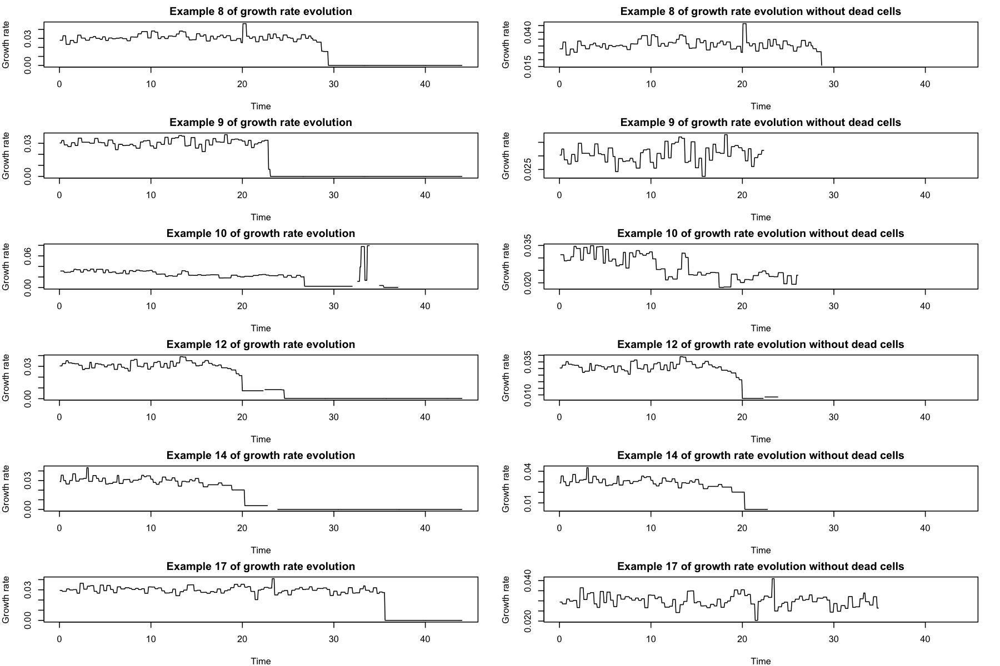

In [34]:
# Regardons quelques exemples :

par(mfrow=c(6,2), mar = c(4, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 8, repr.plot.res = 150)

for (i in c(8,9,10,12,14,17)){
    plot(tmin:tmax*4/60, microMA_MutH_growthRates[tmin:tmax, i], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
    plot(tmin:tmax*4/60, microMA_MutH_growthRates_NAdead[,i], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution without dead cells"))
}

### Deletion of aberrant values

The segmentation errors generated by image analysis can create aberrant, very low or high growth rates. Therefore, we filtered our data in the following way. 

* For each channel and each generation, we **calculated the median of the growth rates for earlier generations (M bef ore ) and subsequent generations (M af ter )**. Growth rate estimates that are clearly aberrant (as confirmed by visual inspection of images) are either much larger than both M bef ore and M af ter or much smaller than both M bef ore and M af ter (Note that M bef ore and M af ter can be significantly different because of the occurrence of deleterious mutations). 

* **Therefore for each generation, we remove the value of the growth rate μ from the data if it di↵ers from both M af ter and M bef ore by more than a threshold value T. The value T was fixed at 30% of the average growth rate in the experiment**, corresponding to the mean+/ 2standard deviation of the variable μ M af ter (or equivalently μ M bef ore ; both variables follow a distribution that is well approximated by a gaussian). The datasets for all strains (WT mutH, mutT, and MF1 such as plotted in Figure 3A and Figure S8) were all filtered using the same procedure.


In [35]:
detect_aberrant_GR <- function(df, width){
    # Rolling medians with a kernel aligned to the left or the right to each value
    M_before <- rollapply(df, width=width, median, align = 'right', na.rm = TRUE, fill = NA, partial = TRUE)
    M_after <- rollapply(df, width=width, median, align = 'left', na.rm = TRUE, fill = NA, partial = TRUE)
    
    # Replace the 30 first or last medians when they cannot be computed correctly
    first_GRs <- sapply(df, function(X){1:length(X) %in% head(which(!is.na(X)), 30)})
    last_GRs <- sapply(df, function(X){1:length(X) %in% tail(which(!is.na(X)), 30)})

    M_before[first_GRs] <- M_after[first_GRs][1]
    M_after[last_GRs] <- M_before[last_GRs][30]
    
    # Threshold = mean growth rate (for non-zero values)
    T <- 0.3*colMeans(df, na.rm=TRUE)

    return(t((t(df - M_before) > T & t(df - M_after) > T)|(t(df - M_before) < -T & t(df - M_after) < -T)))
}

width=101

microMA_WT_growthRates_NAdead_NAab <- microMA_WT_growthRates_NAdead
microMA_WT_growthRates_NAdead_NAab[detect_aberrant_GR(microMA_WT_growthRates_NAdead_NAab, width)] <- NA
microMA_WT_growthRates_NAdead_NAab <- remove_NA_cols(microMA_WT_growthRates_NAdead_NAab)

microMA_MutH_growthRates_NAdead_NAab <- microMA_MutH_growthRates_NAdead
microMA_MutH_growthRates_NAdead_NAab[detect_aberrant_GR(microMA_MutH_growthRates_NAdead_NAab, width)] <- NA
microMA_MutH_growthRates_NAdead_NAab <- remove_NA_cols(microMA_MutH_growthRates_NAdead_NAab)

microMA_MutT_growthRates_NAdead_NAab <- microMA_MutT_growthRates_NAdead
microMA_MutT_growthRates_NAdead_NAab[detect_aberrant_GR(microMA_MutT_growthRates_NAdead_NAab, width)] <- NA
microMA_MutT_growthRates_NAdead_NAab <- remove_NA_cols(microMA_MutT_growthRates_NAdead_NAab)

microMA_MF1_growthRates_NAdead_NAab <- microMA_MF1_growthRates_NAdead
microMA_MF1_growthRates_NAdead_NAab[detect_aberrant_GR(microMA_MF1_growthRates_NAdead_NAab, width)] <- NA
microMA_MF1_growthRates_NAdead_NAab <- remove_NA_cols(microMA_MF1_growthRates_NAdead_NAab)

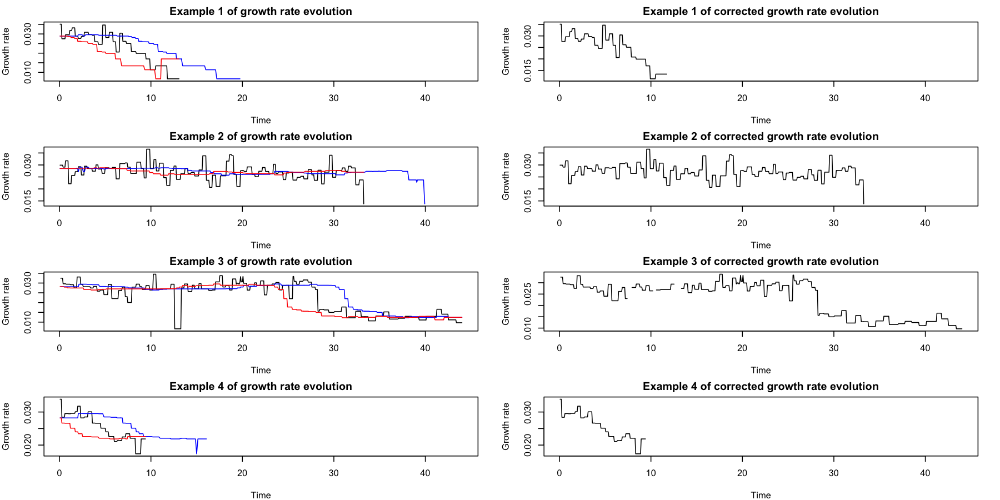

In [36]:
# Regardons quelques exemples :

par(mfrow=c(4,2), mar = c(4, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 150)

for (i in 1:4){    
    df <- microMA_MF1_growthRates_NAdead[,c(i,9)]
    
    plot(tmin:tmax*4/60, df[,1], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
    
    # Rolling medians with a kernel aligned to the left or the right to each value
    M_before <- rollapply(df, width=width, median, align = 'right', na.rm = TRUE, fill = NA, partial = TRUE)
    M_after <- rollapply(df, width=width, median, align = 'left', na.rm = TRUE, fill = NA, partial = TRUE)
        
    # Replace the 30 first or last medians when they cannot be computed correctly
    first_GRs <- sapply(df, function(X){1:length(X) %in% head(which(!is.na(X)), 30)})
    last_GRs <- sapply(df, function(X){1:length(X) %in% tail(which(!is.na(X)), 30)})

    M_before[first_GRs] <- M_after[first_GRs][1]
    M_after[last_GRs] <- M_before[last_GRs][30]
    
    points(tmin:tmax*4/60, M_before[,1], col="blue", type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
    points(tmin:tmax*4/60, M_after[,1], col="red", type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
    
    plot(tmin:tmax*4/60, microMA_MF1_growthRates_NAdead_NAab[, i], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of corrected growth rate evolution"))
}

In [37]:
write.csv2(microMA_WT_growthRates_NAdead_NAab, "Donnees_article_modifiees/data_microMA/dataset_microMA_WT_growthRates_NAdead_NAab.csv")
write.csv2(microMA_MutH_growthRates_NAdead_NAab, "Donnees_article_modifiees/data_microMA/dataset_microMA_MutH_growthRates_NAdead_NAab.csv")
write.csv2(microMA_MutT_growthRates_NAdead_NAab, "Donnees_article_modifiees/data_microMA/dataset_microMA_MutT_growthRates_NAdead_NAab.csv")
write.csv2(microMA_MF1_growthRates_NAdead_NAab, "Donnees_article_modifiees/data_microMA/dataset_microMA_MF1_growthRates_NAdead_NAab.csv")

### Estimation des moments

In [38]:
microMA_WT_growthRates_NAdead_NAab <- read.csv2("Donnees_article_modifiees/data_microMA/dataset_microMA_WT_growthRates_NAdead_NAab.csv", row.names = 1)
microMA_MutH_growthRates_NAdead_NAab <- read.csv2("Donnees_article_modifiees/data_microMA/dataset_microMA_MutH_growthRates_NAdead_NAab.csv", row.names = 1)
microMA_MutT_growthRates_NAdead_NAab <- read.csv2("Donnees_article_modifiees/data_microMA/dataset_microMA_MutT_growthRates_NAdead_NAab.csv", row.names = 1)
microMA_MF1_growthRates_NAdead_NAab <- read.csv2("Donnees_article_modifiees/data_microMA/dataset_microMA_MF1_growthRates_NAdead_NAab.csv", row.names = 1)

In [39]:
moment_expectation <- function(k, dataset){
  return (rowMeans(dataset**k, na.rm = T))
}

log_choose <- function(k, n, moments_expectations){
  return ((-1)**k*choose(n,k)*log(moments_expectations[,k]))
}

k_values=1:10
moments_expectations_clean_MutH <- data.frame(sapply(k_values, 
                                                     moment_expectation, 
                                                     dataset=microMA_MutH_growthRates_NAdead_NAab))
names(moments_expectations_clean_MutH) <- paste("k.", k_values, sep = "")

moments_expectations_clean_WT <- data.frame(sapply(k_values, 
                                                   moment_expectation, 
                                                   dataset=microMA_WT_growthRates_NAdead_NAab))
names(moments_expectations_clean_WT) <- paste("k.", k_values, sep = "")

moments_expectations_clean_MutT <- data.frame(sapply(k_values, 
                                                     moment_expectation, 
                                                     dataset=microMA_MutT_growthRates_NAdead_NAab))
names(moments_expectations_clean_MutT) <- paste("k.", k_values, sep = "")

moments_expectations_clean_MF1 <- data.frame(sapply(k_values, 
                                                    moment_expectation, 
                                                    dataset=microMA_MF1_growthRates_NAdead_NAab))
names(moments_expectations_clean_MF1) <- paste("k.", k_values, sep = "")

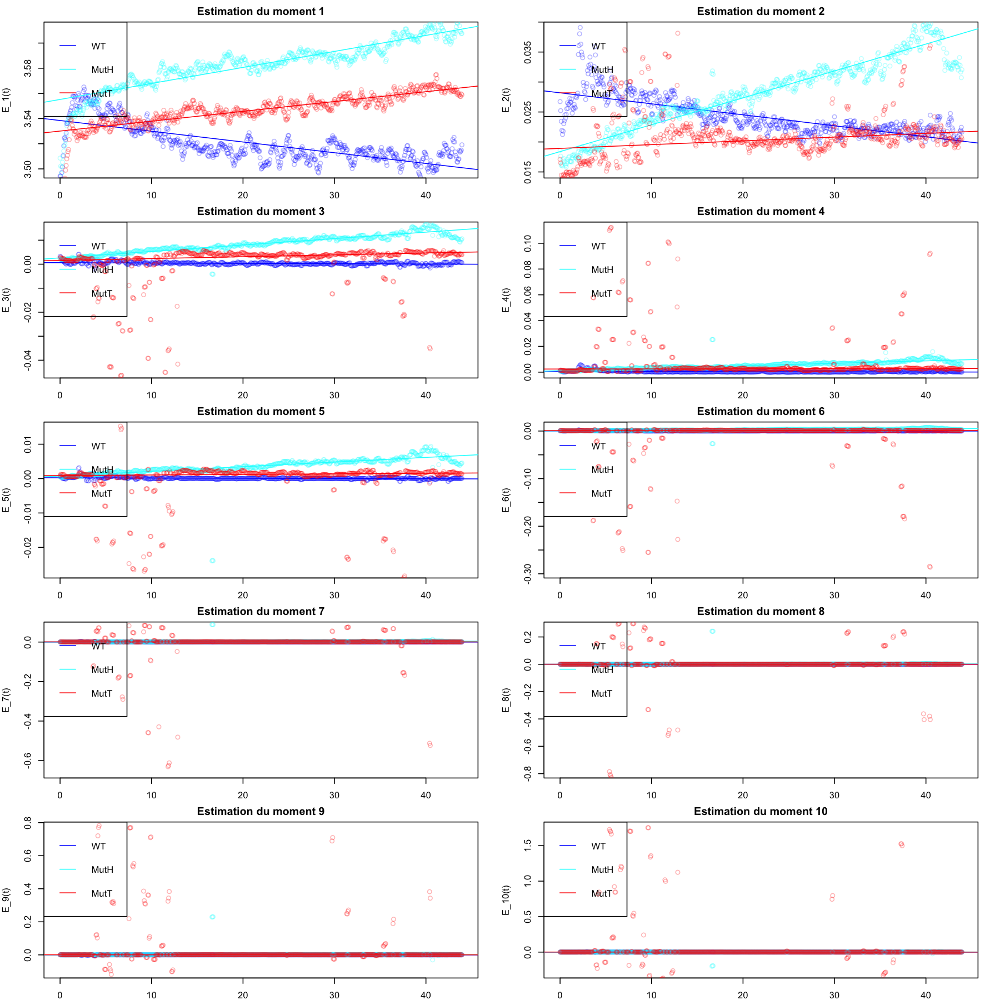

In [40]:
time_window=tmin:tmax
par(mfrow = c(5,2), mar = c(2, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 150)

N <- 10
slopes <- data.frame(n = 1:N, 
                     slope_MutH = rep(NA,N),
                     slope_MutT = rep(NA,N), 
                     slope_MF1 = rep(NA,N),
                     slope_WT = rep(NA,N))

for (n in 1:N){
    df_n <- data.frame(time = microMA_MutH[time_window,]$time/60,
                       E_nt_MutH = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MutH[time_window,])),
                       E_nt_MutT = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MutT[time_window,])),
                       E_nt_WT = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_WT[time_window,])))
    
    
    ### WT
    plot(x = df_n$time, 
         y = df_n$E_nt_WT, 
         xlab = "Time (hr)",
         ylab = paste("E_", n, "(t)", sep = ""),
         ylim = quantile(na.omit(stack(df_n[,c("E_nt_WT", "E_nt_MutH", "E_nt_MutT")])$values), c(0.01, 0.99)),
         col = alpha("blue", 0.3),
         main = paste("Estimation du moment", n))
    
    lin_reg_WT <- rlm(E_nt_WT~time, data=df_n)
    abline(lin_reg_WT, col="blue", lwd=1)
    #slopes[n,7:11] <- c(summary(lin_reg_WT)$coefficients[2,c(1,2)]/60, summary(lin_reg_WT)$r.squared, mean(abs(resid(lin_reg_WT))), sqrt(mean(resid(lin_reg_WT)**2)))
    slopes$slope_WT[n] <- c(summary(lin_reg_WT)$coefficients[2,c(1)]/60)
    
    
    
    ### MutH
    points(x = df_n$time, 
           y = df_n$E_nt_MutH, 
           col = alpha("cyan", 0.3))
    
    lin_reg_MutH <- rlm(E_nt_MutH~time, data=df_n)
    abline(lin_reg_MutH, col="cyan", lwd=1)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MutH[n] <- c(summary(lin_reg_MutH)$coefficients[2,c(1)]/60)
    
        
    ### MutT
    points(x = df_n$time, 
           y = df_n$E_nt_MutT,
           col = alpha("red", 0.3))
    
    lin_reg_MutT <- rlm(E_nt_MutT~time, data=df_n)
    abline(lin_reg_MutT, col="red", lwd=1)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MutT[n] <- c(summary(lin_reg_MutT)$coefficients[2,c(1)]/60)
    
    
    legend("topleft", legend = c("WT", "MutH", "MutT"), col=c("blue", "cyan", "red"), lty=1, seg.len = 1, text.width=3)
    
}

Warning message in rlm.default(x, y, weights, method = method, wt.method = wt.method, :
“'rlm' failed to converge in 20 steps”
Warning message in rlm.default(x, y, weights, method = method, wt.method = wt.method, :
“'rlm' failed to converge in 20 steps”


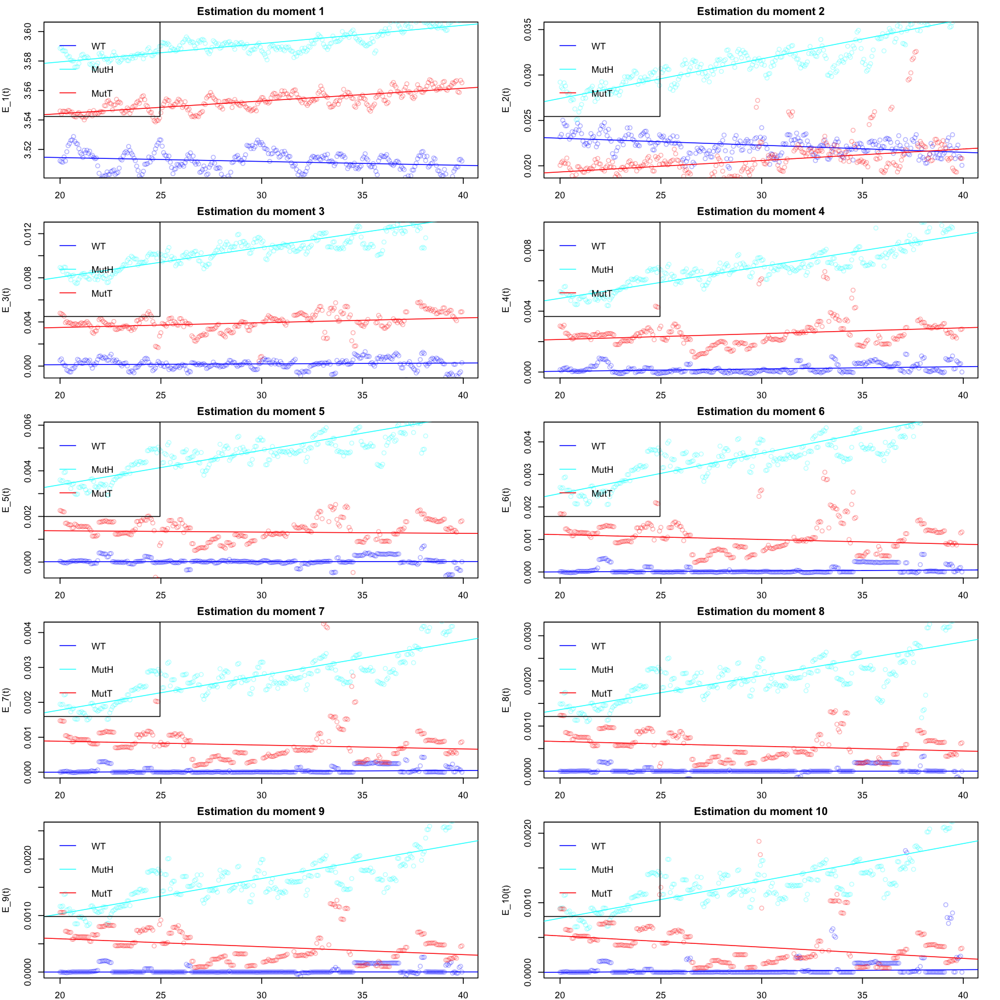

In [41]:
time_window=(tmin+20*15):(tmax-4*15)
par(mfrow = c(5,2), mar = c(2, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 150)

N <- 10
#slopes <- data.frame(n = 1:N,
#                     slope_MutH = rep(NA,N), std_err_MutH = rep(NA,N), r2_MutH = rep(NA,N), resid_L1_MutH = rep(NA,N), resid_L2_MutH = rep(NA,N), 
#                     slope_WT = rep(NA,N), std_err_WT = rep(NA,N), r2_WT = rep(NA,N), resid_L1_WT = rep(NA,N), resid_L2_WT = rep(NA,N))
slopes <- data.frame(n = 1:N, 
                    slope_MutH = rep(NA,N),
                    slope_MutT = rep(NA,N), 
                    slope_MF1 = rep(NA,N),
                    slope_WT = rep(NA,N))

for (n in 1:N){
    df_n <- data.frame(time = microMA_MutH[time_window,]$time/60,
                     E_nt_MutH = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MutH[time_window,])),
                     E_nt_MutT = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MutT[time_window,])),
                     E_nt_WT = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_WT[time_window,])))
    
    
    ### WT
    plot(x = df_n$time, 
         y = df_n$E_nt_WT, 
         xlab = "Time (hr)",
         ylab = paste("E_", n, "(t)", sep = ""),
         ylim = quantile(na.omit(stack(df_n[,c("E_nt_WT", "E_nt_MutH", "E_nt_MutT")])$values), c(0.05, 0.95)),
         col = alpha("blue", 0.3),
         main = paste("Estimation du moment", n))
    
    lin_reg_WT <- rlm(E_nt_WT~time, data=df_n)
    abline(lin_reg_WT, col="blue", lwd=1)
    #slopes[n,7:11] <- c(summary(lin_reg_WT)$coefficients[2,c(1,2)]/60, summary(lin_reg_WT)$r.squared, mean(abs(resid(lin_reg_WT))), sqrt(mean(resid(lin_reg_WT)**2)))
    slopes$slope_WT[n] <- c(summary(lin_reg_WT)$coefficients[2,c(1)]/60)
    
    
    
    ### MutH
    points(x = df_n$time, 
           y = df_n$E_nt_MutH, 
           col = alpha("cyan", 0.3))
    
    lin_reg_MutH <- rlm(E_nt_MutH~time, data=df_n)
    abline(lin_reg_MutH, col="cyan", lwd=1)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MutH[n] <- c(summary(lin_reg_MutH)$coefficients[2,c(1)]/60)
    
        
    ### MutT
    points(x = df_n$time, 
           y = df_n$E_nt_MutT,
           col = alpha("red", 0.3))
    
    lin_reg_MutT <- rlm(E_nt_MutT~time, data=df_n)
    abline(lin_reg_MutT, col="red", lwd=1)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MutT[n] <- c(summary(lin_reg_MutT)$coefficients[2,c(1)]/60)
    
    
    legend("topleft", legend = c("WT", "MutH", "MutT"), col=c("blue", "cyan", "red"), lty=1, seg.len = 1, text.width=3)
    
}

![](Img/Moments_estimation.png)

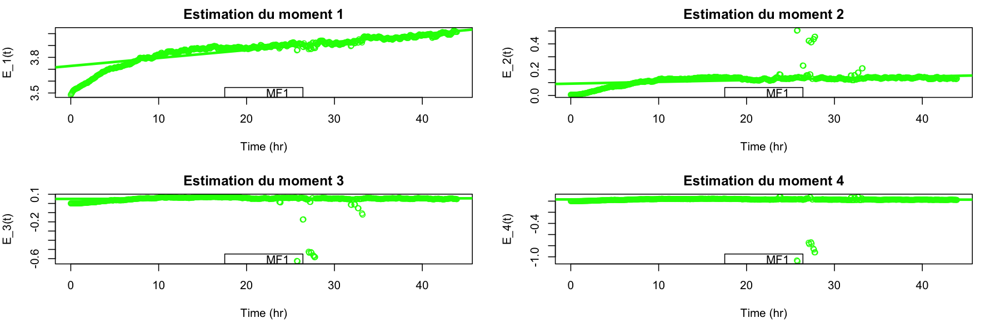

In [42]:
time_window=tmin:tmax
par(mfrow = c(2,2), mar = c(5, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 150)

for (n in 1:4){
    df_n <- data.frame(time = microMA_MutH[time_window,]$time/60,
                     E_nt_MF1 = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MF1[time_window,])))

    
    ### MF1
    plot(x = df_n$time, 
         y = df_n$E_nt_MF1,
         xlab = "Time (hr)",
         ylab = paste("E_", n, "(t)", sep = ""), 
         col = "green",
         main = paste("Estimation du moment", n))
    
    lin_reg_MF1 <- rlm(E_nt_MF1~time, data=df_n)
    abline(lin_reg_MF1, col="green", lwd=3)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MF1[n] <- c(summary(lin_reg_MF1)$coefficients[2,c(1)]/60)

    
  legend("bottom", legend = c("MF1"), col=c("green"), seg.len = 1, text.width=3)
    
}

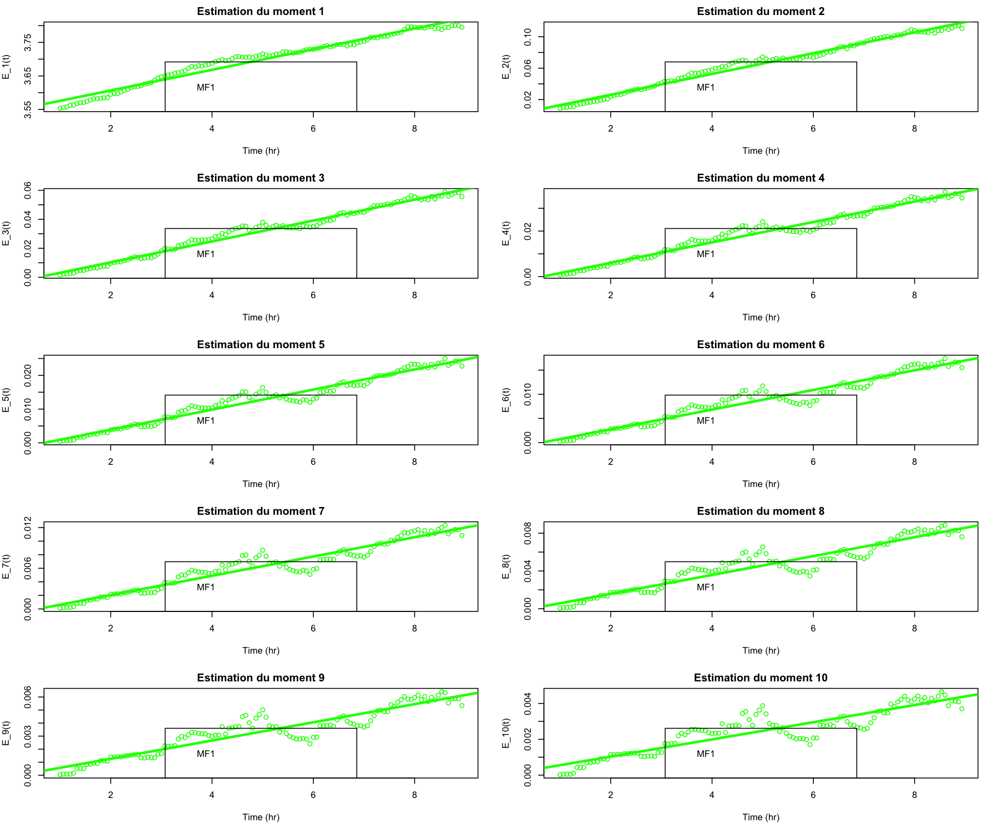

In [43]:
time_window=(tmin+1*15):(tmax-35*15)
par(mfrow = c(5,2), mar = c(5, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 10, repr.plot.res = 150)

for (n in 1:N){
    df_n <- data.frame(time = microMA_MutH[time_window,]$time/60,
                     E_nt_MF1 = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_MF1[time_window,])))

    
    ### MF1
    plot(x = df_n$time, 
         y = df_n$E_nt_MF1,
         xlab = "Time (hr)",
         ylab = paste("E_", n, "(t)", sep = ""),
         col = "green",
         main = paste("Estimation du moment", n))
    
    lin_reg_MF1 <- rlm(E_nt_MF1~time, data=df_n)
    abline(lin_reg_MF1, col="green", lwd=3)
    #slopes[n,2:6] <- c(summary(lin_reg_MutH)$coefficients[2,c(1,2)]/60, summary(lin_reg_MutH)$r.squared, mean(abs(resid(lin_reg_MutH))), sqrt(mean(resid(lin_reg_MutH)**2)))
    slopes$slope_MF1[n] <- c(summary(lin_reg_MF1)$coefficients[2,c(1)]/60)

    
  legend("bottom", legend = c("MF1"), col=c("green"), seg.len = 1, text.width=3)
    
}

In [44]:
mult_factor = c(10**5, 10**6, 10**6, rep(10**7, 7))
cbind(slopes[1], mult_factor=mult_factor, signif(slopes[-1], digits=2)*mult_factor)

n,mult_factor,slope_MutH,slope_MutT,slope_MF1,slope_WT
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1e+05,2.1,1.40,51,-0.44000
2,1e+06,7.3,2.10,220,-1.30000
3,1e+06,4.5,0.72,120,0.13000
4,1e+07,35.0,6.40,750,2.60000
5,1e+07,25.0,-0.94,500,0.09300
6,1e+07,21.0,-2.50,340,0.50000
7,1e+07,17.0,-1.80,240,0.42000
8,1e+07,13.0,-1.80,170,0.00072
9,1e+07,10.0,-2.30,120,0.01200


 ![](Img/Slope_values.png)

In [45]:
DFE_moments <- slopes
names(DFE_moments) <- c("Order", "MutH", "MutT", "MF1", "WT")
DFE_moments$MutH <- DFE_moments$MutH/0.0054
DFE_moments$MutT <- DFE_moments$MutT/0.0063
DFE_moments$MF1 <- DFE_moments$MF1/0.1
DFE_moments$WT <- DFE_moments$WT/0.0000271
signif(DFE_moments, digits=2)

Order,MutH,MutT,MF1,WT
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.00380,2.3e-03,0.00510,-1.6e-01
2,0.00130,3.4e-04,0.00220,-4.8e-02
3,0.00084,1.1e-04,0.00120,4.8e-03
4,0.00065,1.0e-04,0.00075,9.4e-03
5,0.00047,-1.5e-05,0.00050,3.4e-04
6,0.00038,-3.9e-05,0.00034,1.9e-03
7,0.00031,-2.9e-05,0.00024,1.6e-03
8,0.00023,-2.8e-05,0.00017,2.7e-06
9,0.00019,-3.7e-05,0.00012,4.4e-05


Le moment centré d’ordre $r$ s’écrit à partir des moments ordinaires $m_i$ :

$$\mu_r = \sum_{i=0}^r C_r^i \, m_{r-i} \, (-m_1)^i = \sum_{i=0}^r C_r^i \, m_i \, (-m_1)^{r-i}$$

In [46]:
centeredMoments <- function(M){
    CM <- M
    M <- c(0,M)
    for (r in 1:length(CM)){
        CM[r] <- sum(sapply(0:r, function(i){choose(r,i)*M[r-i+1]*(-M[2])**i}))
    }
    return (CM)
}

DFE_centered_moments <- DFE_moments
names(DFE_centered_moments) <- c("Order", "MutH", "MutT", "MF1", "WT")
DFE_centered_moments$MutH <- centeredMoments(DFE_centered_moments$MutH)
DFE_centered_moments$MutT <- centeredMoments(DFE_centered_moments$MutT)
DFE_centered_moments$MF1 <- centeredMoments(DFE_centered_moments$MF1)
DFE_centered_moments$WT <- centeredMoments(DFE_centered_moments$WT)
signif(DFE_centered_moments, digits=2)

Order,MutH,MutT,MF1,WT
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.00380,2.3e-03,5.1e-03,-0.1600
2,0.00130,3.2e-04,2.2e-03,-0.1000
3,0.00082,1.1e-04,1.2e-03,-0.0310
4,0.00063,1.0e-04,7.2e-04,0.0022
5,0.00045,-1.6e-05,4.8e-04,0.0066
6,0.00037,-3.9e-05,3.2e-04,0.0057
7,0.00030,-2.9e-05,2.3e-04,0.0053
8,0.00022,-2.7e-05,1.6e-04,0.0040
9,0.00018,-3.7e-05,1.1e-04,0.0024


Le moment standardisé d’ordre $r$ s’écrit, à partir des moments centrés $\mu_r$ et de l'écart-type $\sigma$ : 

$$\tilde\mu_r = \frac{\mu_r}{\sigma^r}$$

In [47]:
sigma = sqrt(abs(DFE_moments[2,2:4]-DFE_moments[1,2:4]**2))
standardized_moments <- data.frame(t(sapply(1:10, function(i){DFE_centered_moments[i,2:4]/sigma**i})))
standardized_moments <- data.frame(Order=1:10,sapply(standardized_moments, as.numeric))
signif(standardized_moments, 2)

Order,MutH,MutT,MF1
<dbl>,<dbl>,<dbl>,<dbl>
1,1.1e-01,1.3e-01,1.1e-01
2,9.9e-01,9.8e-01,9.9e-01
3,1.7e+01,1.9e+01,1.1e+01
4,3.6e+02,9.2e+02,1.5e+02
5,7.0e+03,-8.1e+03,2.1e+03
6,1.6e+05,-1.1e+06,3.1e+04
7,3.4e+06,-4.4e+07,4.7e+05
8,7.1e+07,-2.3e+09,6.9e+06
9,1.6e+09,-1.7e+11,1.0e+08


 ![](Img/Moments.png)

## Analyse de sensibilité

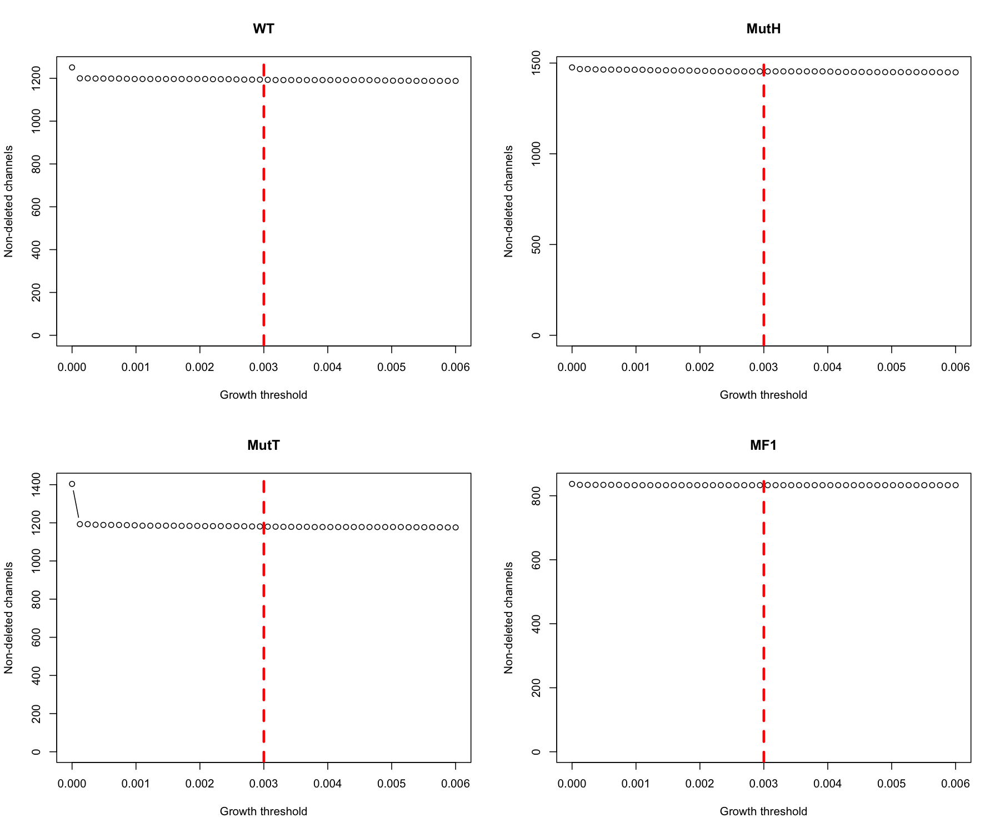

In [48]:
thresholds <- seq(0,0.006,length.out=50)
remaining_cells <- data.frame(threshold = thresholds,
                              WT=sapply(thresholds, function(threshold)dim(remove_slow_GR(microMA_WT_growthRates, threshold, keep_cells, tmin, tmax))[2]),
                              MutH=sapply(thresholds, function(threshold)dim(remove_slow_GR(microMA_MutH_growthRates, threshold, keep_cells, tmin, tmax))[2]),
                              MutT=sapply(thresholds, function(threshold)dim(remove_slow_GR(microMA_MutT_growthRates, threshold, keep_cells, tmin, tmax))[2]),
                              MF1=sapply(thresholds, function(threshold)dim(remove_slow_GR(microMA_MF1_growthRates, threshold, keep_cells, tmin, tmax))[2]))

par(mfrow=c(2,2))
for (line in c("WT", "MutH", "MutT", "MF1")){
    plot(remaining_cells$threshold, remaining_cells[,line], ylim=c(0,remaining_cells[1,line]), type="b",
         main = line, xlab="Growth threshold", ylab="Non-deleted channels")
    abline(v = threshold, col="red", lwd=3, lty=2)
}

$\to$ The chosen threshold (0.003) is not in an area of important change of the numbre of deleted microchannels

## Generations : cell lengths and count

"*Single cells elongate exponentially between birth and division, while their width stays constant. Single-cell growth rate (i.e. fitness) is therefore defined as the rate of cell elongation.*"

Compute the cell length at the time of division (growth rate x generation time) :

In [49]:
cell_lengths <- function(x){
    RLE <- rle(x)
    time <- RLE$lengths*4   # Convert to minutes
    growthR <- RLE$values   # Rates of exponential growth
    return(na.omit(exp(time*growthR)))
}

cellSizes <- as.numeric(unlist(lapply(microMA_MutH_growthRates_NAdead_NAab, cell_lengths)))
head(cellSizes)

[1] 1.325987 4.173269 1.267098 1.764571 1.818992 1.806983

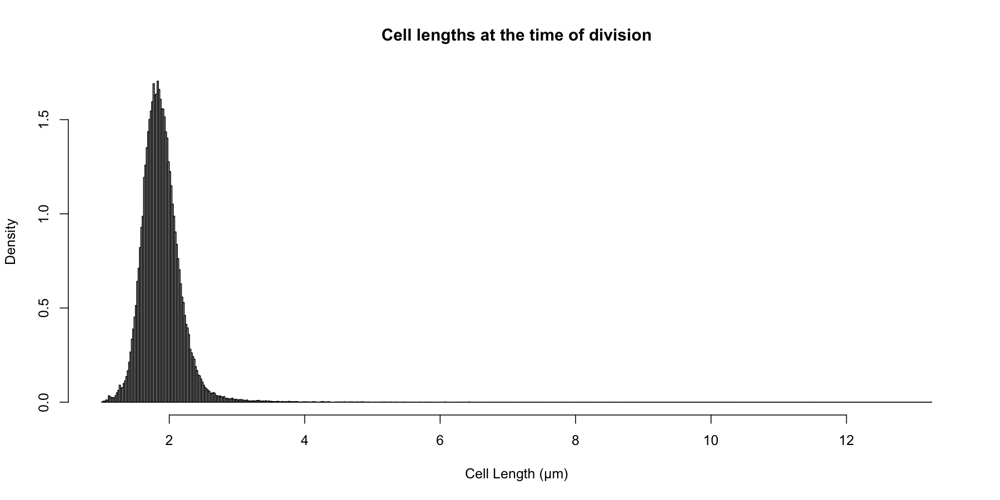

In [50]:
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 150)
hist(cellSizes, breaks=500, probability = TRUE, main="Cell lengths at the time of division", xlab="Cell Length (µm)")

In [51]:
mean(cellSizes)
median(cellSizes)

[1] 1.884299

[1] 1.853858

In [52]:
cell_lengths <- function(x){
    RLE <- rle(x)
    time <- RLE$lengths*4   # Convert to minutes
    growthR <- RLE$values   # Rates of exponential growth
    return(na.omit(time*growthR))
}

cellSizes <- as.numeric(unlist(lapply(microMA_MutH_growthRates_NAdead_NAab, cell_lengths)))
head(cellSizes)

[1] 0.2821572 1.4286998 0.2367292 0.5679078 0.5982823 0.5916586

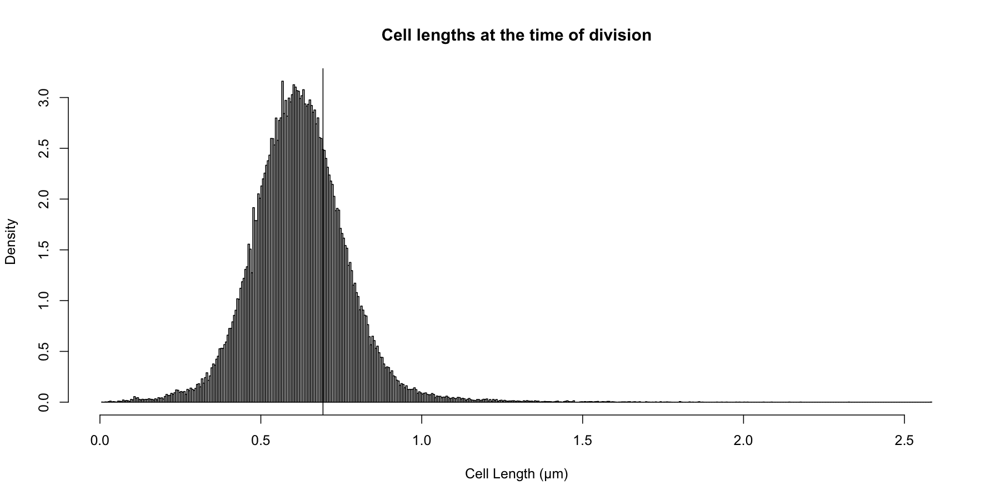

In [53]:
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 150)
hist(cellSizes, breaks=500, probability = TRUE, main="Cell lengths at the time of division", xlab="Cell Length (µm)")
abline(v=log(2))

In [54]:
mean(cellSizes)
median(cellSizes)

[1] 0.6219815

[1] 0.6172687

In [55]:
log(2)

[1] 0.6931472

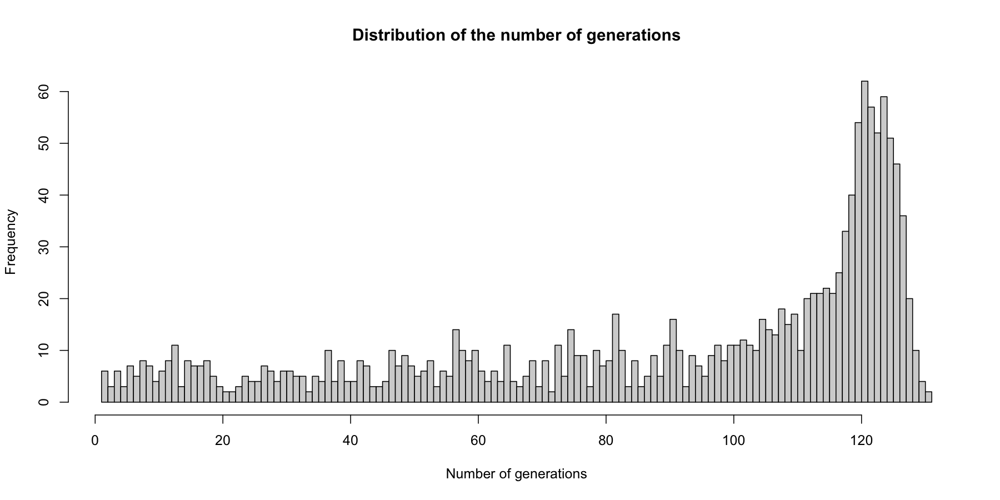

In [56]:
hist(sapply(microMA_MutH_growthRates_NAdead_NAab, function(x)sum(!is.na(rle(x)$values))), breaks=100, 
            main="Distribution of the number of generations", xlab="Number of generations")

In [57]:
# Expected number of generations at constant growth rate 0.03 during the experiment
0.03*660*4/log(2)

[1] 114.2614

# Test des méthodes sur les données simulées

## Fichiers de simulations

In [58]:
growthR_sim <- data.frame(sapply(read.csv2("Donnees_simulees/growthR_sim.csv", header=F), as.numeric))
growthR_sim_noise <- data.frame(sapply(read.csv2("Donnees_simulees/growthR_sim_noise.csv", header=F), as.numeric))

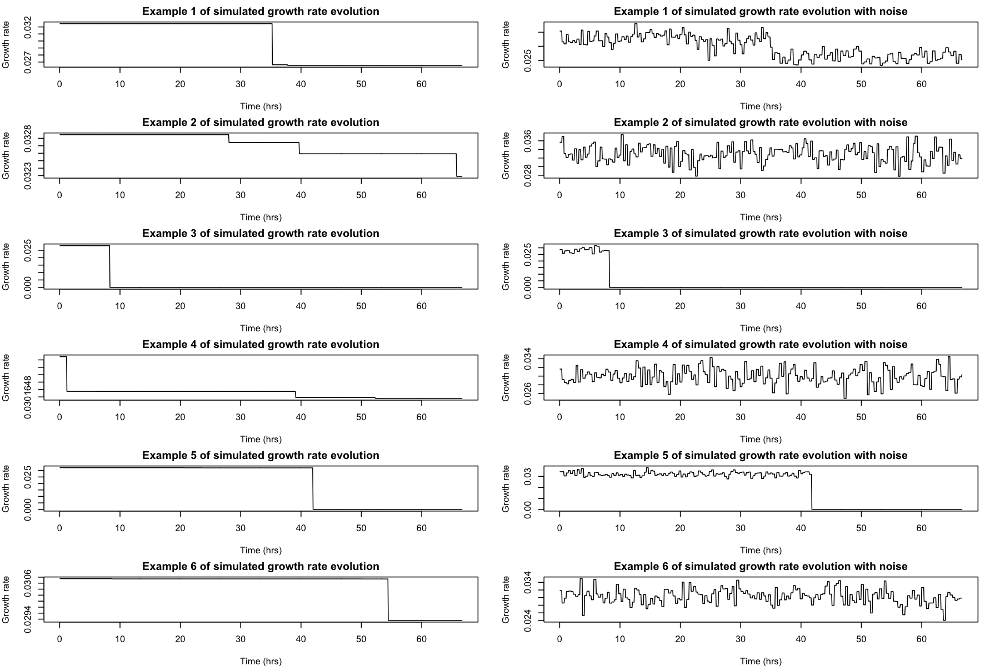

In [59]:
par(mfrow=c(6,2), mar = c(4, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 8, repr.plot.res = 150)

for (i in 1:6){
    plot(1:dim(growthR_sim)[1]*4/60, growthR_sim[, i], type="l", xlab = "Time (hrs)", ylab = "Growth rate", main = paste("Example",i,"of simulated growth rate evolution"))
    plot(1:dim(growthR_sim_noise)[1]*4/60, growthR_sim_noise[, i], type="l", xlab = "Time (hrs)", ylab = "Growth rate", main = paste("Example",i,"of simulated growth rate evolution with noise"))
}

#dev.off()

## Traitement des données : supprimer canaux avec cellules mortes

### Deletion of slowly growing/dead cells

In [60]:
tmin=1
tmax=44*15
threshold <- 0.003
keep_cells <- TRUE  # wether to keep early cells even if the mother cell dies later on
                      
print("growthR_sim")
growthR_sim_NAdead <- remove_slow_GR(growthR_sim, threshold, keep_cells, tmin, tmax, verbose=T)

print("growthR_sim_noise")
growthR_sim_noise_NAdead <- remove_slow_GR(growthR_sim_noise, threshold, keep_cells, tmin, tmax, verbose=T)

[1] "growthR_sim"
[1] "slow_channels : 232"
[1] 1000 1476
[1] "growthR_sim_noise"
[1] "slow_channels : 232"
[1] 1000 1476


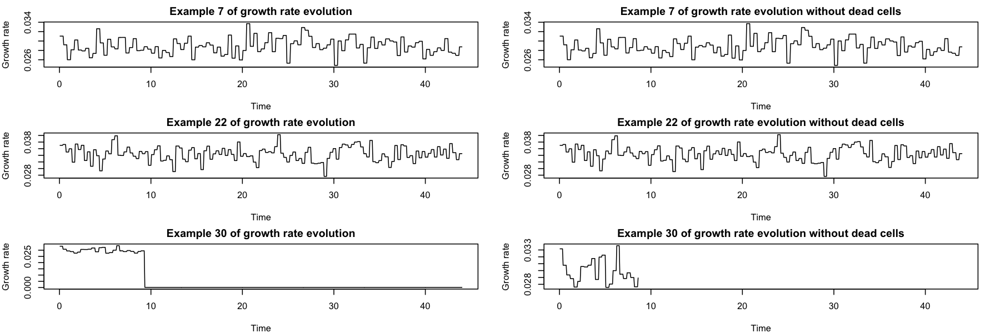

In [61]:
# Let us look at some examples:

par(mfrow=c(3,2), mar = c(4, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 150)

for (i in c(7,22,30)){
    plot(tmin:tmax*4/60, growthR_sim_noise[tmin:tmax, i], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
    plot(tmin:tmax*4/60, growthR_sim_noise_NAdead[,i], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution without dead cells"))
}

### Deletion of aberrant values

The segmentation errors generated by image analysis can create aberrant, very low or high growth rates. Therefore, we filtered our data in the following way. 

* For each channel and each generation, we **calculated the median of the growth rates for earlier generations (M bef ore ) and subsequent generations (M af ter )**. Growth rate estimates that are clearly aberrant (as confirmed by visual inspection of images) are either much larger than both M bef ore and M af ter or much smaller than both M bef ore and M af ter (Note that M bef ore and M af ter can be significantly different because of the occurrence of deleterious mutations). 

* **Therefore for each generation, we remove the value of the growth rate μ from the data if it di↵ers from both M af ter and M bef ore by more than a threshold value T. The value T was fixed at 30% of the average growth rate in the experiment**, corresponding to the mean+/ 2standard deviation of the variable μ M af ter (or equivalently μ M bef ore ; both variables follow a distribution that is well approximated by a gaussian). The datasets for all strains (growthR_sim growthR_sim_noise, mutT, and MF1 such as plotted in Figure 3A and Figure S8) were all filtered using the same procedure.


In [62]:
width=101

growthR_sim_NAdead_NAab <- growthR_sim_NAdead
growthR_sim_NAdead_NAab[detect_aberrant_GR(growthR_sim_NAdead_NAab, width)] <- NA
growthR_sim_NAdead_NAab <- remove_NA_cols(growthR_sim_NAdead_NAab)

growthR_sim_noise_NAdead_NAab <- growthR_sim_noise_NAdead
growthR_sim_noise_NAdead_NAab[detect_aberrant_GR(growthR_sim_noise_NAdead_NAab, width)] <- NA
growthR_sim_noise_NAdead_NAab <- remove_NA_cols(growthR_sim_noise_NAdead_NAab)

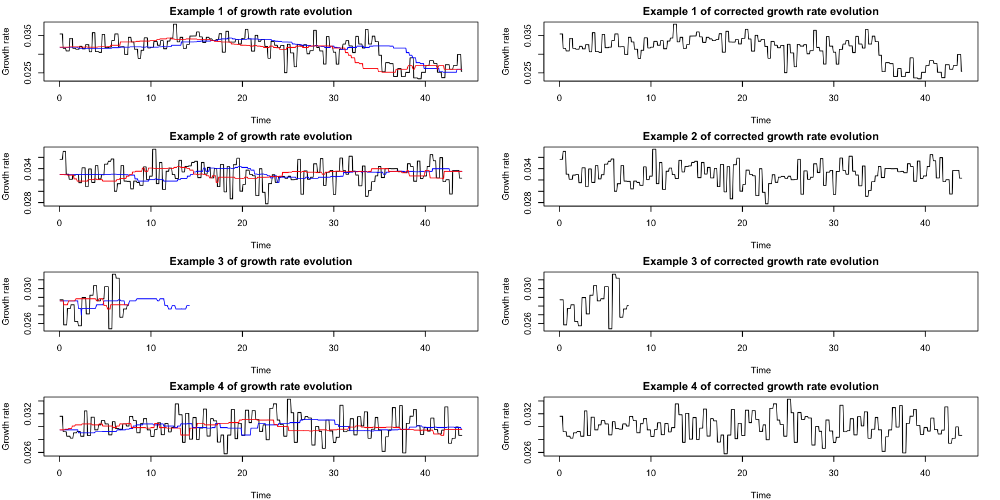

In [63]:
# Let us look at some examples:

par(mfrow=c(4,2), mar = c(4, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 150)

for (i in 1:4){    
    df <- growthR_sim_noise_NAdead[,c(i,9)]
    
    plot(tmin:tmax*4/60, df[,1], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
    
    # Rolling medians with a kernel aligned to the left or the right to each value
    M_before <- rollapply(df, width=width, median, align = 'right', na.rm = TRUE, fill = NA, partial = TRUE)
    M_after <- rollapply(df, width=width, median, align = 'left', na.rm = TRUE, fill = NA, partial = TRUE)
        
    # Replace the 30 first or last medians when they cannot be computed correctly
    first_GRs <- sapply(df, function(X){1:length(X) %in% head(which(!is.na(X)), 30)})
    last_GRs <- sapply(df, function(X){1:length(X) %in% tail(which(!is.na(X)), 30)})

    M_before[first_GRs] <- M_after[first_GRs][1]
    M_after[last_GRs] <- M_before[last_GRs][30]
    
    points(tmin:tmax*4/60, M_before[,1], col="blue", type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
    points(tmin:tmax*4/60, M_after[,1], col="red", type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of growth rate evolution"))
    
    plot(tmin:tmax*4/60, growthR_sim_noise_NAdead_NAab[, i], type="l", xlab = "Time", ylab = "Growth rate", main = paste("Example",i,"of corrected growth rate evolution"))
}

In [64]:
write.csv2(growthR_sim_NAdead_NAab, "Donnees_article_modifiees/data_microMA/dataset_growthR_sim_NAdead_NAab.csv")
write.csv2(growthR_sim_noise_NAdead_NAab, "Donnees_article_modifiees/data_microMA/dataset_growthR_sim_noise_NAdead_NAab.csv")

### Moments estimation

In [65]:
growthR_sim_NAdead_NAab <- read.csv2("Donnees_article_modifiees/data_microMA/dataset_growthR_sim_NAdead_NAab.csv", row.names = 1)
growthR_sim_noise_NAdead_NAab <- read.csv2("Donnees_article_modifiees/data_microMA/dataset_growthR_sim_noise_NAdead_NAab.csv", row.names = 1)

In [66]:
moment_expectation <- function(k, dataset){
  return (rowMeans(dataset**k, na.rm = T))
}

log_choose <- function(k, n, moments_expectations){
  return ((-1)**k*choose(n,k)*log(moments_expectations[,k]))
}

k_values=1:10
moments_expectations_clean_growthR_sim_noise <- data.frame(sapply(k_values, 
                                                     moment_expectation, 
                                                     dataset=growthR_sim_noise_NAdead_NAab))
names(moments_expectations_clean_growthR_sim_noise) <- paste("k.", k_values, sep = "")

moments_expectations_clean_growthR_sim <- data.frame(sapply(k_values, 
                                                   moment_expectation, 
                                                   dataset=growthR_sim_NAdead_NAab))
names(moments_expectations_clean_growthR_sim) <- paste("k.", k_values, sep = "")

Warning message in rlm.default(x, y, weights, method = method, wt.method = wt.method, :
“'rlm' failed to converge in 20 steps”
Warning message in rlm.default(x, y, weights, method = method, wt.method = wt.method, :
“'rlm' failed to converge in 20 steps”


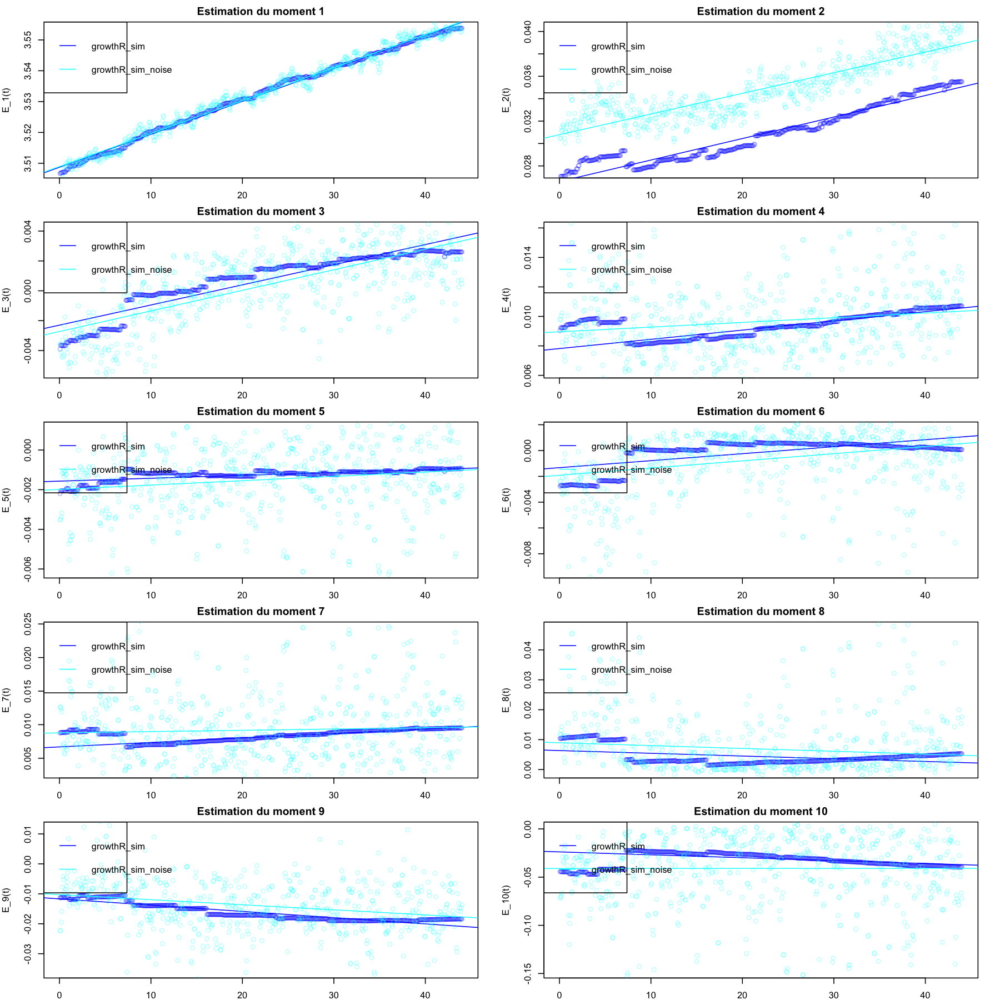

In [67]:
time_window=tmin:tmax
par(mfrow = c(5,2), mar = c(2, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 150)

N <- 10
slopes <- data.frame(n = 1:N, 
                     slope_growthR_sim_noise = rep(NA,N),
                     slope_growthR_sim = rep(NA,N))

for (n in 1:N){
    df_n <- data.frame(time = time_window*4/60,
                       E_nt_growthR_sim_noise = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_growthR_sim_noise[time_window,])),
                       E_nt_growthR_sim = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_growthR_sim[time_window,])))
    
    
    ### growthR_sim
    plot(x = df_n$time, 
         y = df_n$E_nt_growthR_sim, 
         xlab = "Time (hr)",
         ylab = paste("E_", n, "(t)", sep = ""),
         ylim = quantile(na.omit(stack(df_n[,c("E_nt_growthR_sim", "E_nt_growthR_sim_noise")])$values), c(0.01, 0.99)),
         col = alpha("blue", 0.3),
         main = paste("Estimation du moment", n))
    
    lin_reg_growthR_sim <- rlm(E_nt_growthR_sim~time, data=df_n)
    abline(lin_reg_growthR_sim, col="blue", lwd=1)
    #slopes[n,7:11] <- c(summary(lin_reg_growthR_sim)$coefficients[2,c(1,2)]/60, summary(lin_reg_growthR_sim)$r.squared, mean(abs(resid(lin_reg_growthR_sim))), sqrt(mean(resid(lin_reg_growthR_sim)**2)))
    slopes$slope_growthR_sim[n] <- c(summary(lin_reg_growthR_sim)$coefficients[2,c(1)]/60)
    
    
    
    ### growthR_sim_noise
    points(x = df_n$time, 
           y = df_n$E_nt_growthR_sim_noise, 
           col = alpha("cyan", 0.3))
    
    lin_reg_growthR_sim_noise <- rlm(E_nt_growthR_sim_noise~time, data=df_n)
    abline(lin_reg_growthR_sim_noise, col="cyan", lwd=1)
    #slopes[n,2:6] <- c(summary(lin_reg_growthR_sim_noise)$coefficients[2,c(1,2)]/60, summary(lin_reg_growthR_sim_noise)$r.squared, mean(abs(resid(lin_reg_growthR_sim_noise))), sqrt(mean(resid(lin_reg_growthR_sim_noise)**2)))
    slopes$slope_growthR_sim_noise[n] <- c(summary(lin_reg_growthR_sim_noise)$coefficients[2,c(1)]/60)  
    
    legend("topleft", legend = c("growthR_sim", "growthR_sim_noise"), col=c("blue", "cyan"), lty=1, seg.len = 1, text.width=3)
    
}

Warning message in rlm.default(x, y, weights, method = method, wt.method = wt.method, :
“'rlm' failed to converge in 20 steps”


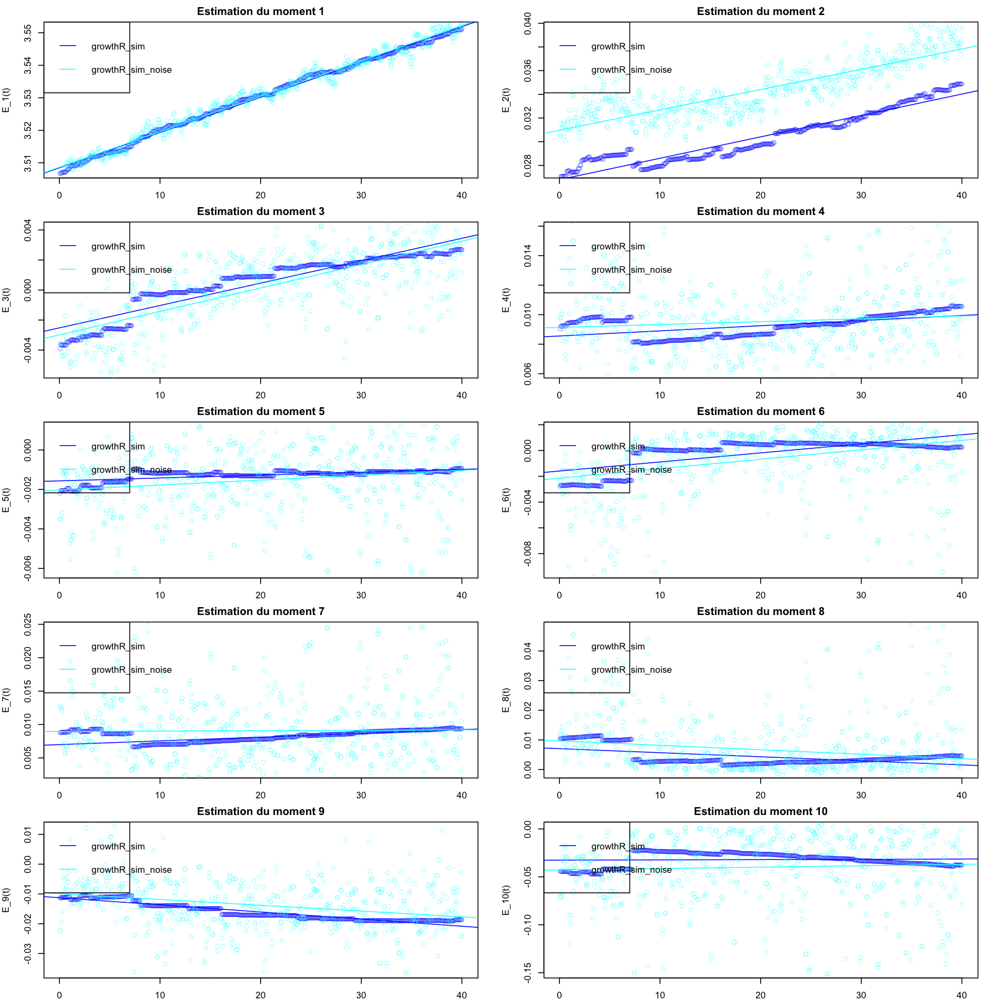

In [68]:
time_window=(tmin):(tmax-4*15)
par(mfrow = c(5,2), mar = c(2, 4, 2, 2))
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 150)

N <- 10
slopes <- data.frame(n = 1:N, 
                    slope_growthR_sim_noise = rep(NA,N),
                    slope_growthR_sim = rep(NA,N))

for (n in 1:N){
    df_n <- data.frame(time = time_window*4/60,
                       E_nt_growthR_sim_noise = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_growthR_sim_noise[time_window,])),
                       E_nt_growthR_sim = rowSums(sapply(1:n, log_choose, n=n, moments_expectations=moments_expectations_clean_growthR_sim[time_window,])))
    
    
    ### growthR_sim
    plot(x = df_n$time, 
         y = df_n$E_nt_growthR_sim, 
         xlab = "Time (hr)",
         ylab = paste("E_", n, "(t)", sep = ""),
         ylim = quantile(na.omit(stack(df_n[,c("E_nt_growthR_sim", "E_nt_growthR_sim_noise")])$values), c(0.01, 0.99)),
         col = alpha("blue", 0.3),
         main = paste("Estimation du moment", n))
    
    lin_reg_growthR_sim <- rlm(E_nt_growthR_sim~time, data=df_n)
    abline(lin_reg_growthR_sim, col="blue", lwd=1)
    slopes$slope_growthR_sim[n] <- c(summary(lin_reg_growthR_sim)$coefficients[2,c(1)]/60)
    
    
    
    ### growthR_sim_noise
    points(x = df_n$time, 
           y = df_n$E_nt_growthR_sim_noise, 
           col = alpha("cyan", 0.3))
    
    lin_reg_growthR_sim_noise <- rlm(E_nt_growthR_sim_noise~time, data=df_n)
    abline(lin_reg_growthR_sim_noise, col="cyan", lwd=1)
    #slopes[n,2:6] <- c(summary(lin_reg_growthR_sim_noise)$coefficients[2,c(1,2)]/60, summary(lin_reg_growthR_sim_noise)$r.squared, mean(abs(resid(lin_reg_growthR_sim_noise))), sqrt(mean(resid(lin_reg_growthR_sim_noise)**2)))
    slopes$slope_growthR_sim_noise[n] <- c(summary(lin_reg_growthR_sim_noise)$coefficients[2,c(1)]/60)
    
    legend("topleft", legend = c("growthR_sim", "growthR_sim_noise"), col=c("blue", "cyan", "red"), lty=1, seg.len = 1, text.width=3)
    
}

In [69]:
mult_factor = c(10**5, 10**6, 10**6, rep(10**7, 7))
cbind(slopes[1], mult_factor=mult_factor, signif(slopes[-1], digits=2)*mult_factor)

n,mult_factor,slope_growthR_sim_noise,slope_growthR_sim
<int>,<dbl>,<dbl>,<dbl>
1,1e+05,1.8,1.8
2,1e+06,2.9,3.0
3,1e+06,2.6,2.5
4,1e+07,3.2,5.8
5,1e+07,4.1,2.4
6,1e+07,12.0,12.0
7,1e+07,1.0,9.3
8,1e+07,-25.0,-23.0
9,1e+07,-33.0,-40.0


In [70]:
DFE_moments <- slopes
names(DFE_moments) <- c("Order", "growthR_sim_noise", "growthR_sim")
DFE_moments$growthR_sim_noise <- DFE_moments$growthR_sim_noise/(0.32/60)
DFE_moments$growthR_sim <- DFE_moments$growthR_sim/(0.32/60)
signif(DFE_moments, digits=2)

Order,growthR_sim_noise,growthR_sim
<dbl>,<dbl>,<dbl>
1,3.4e-03,3.4e-03
2,5.4e-04,5.6e-04
3,4.9e-04,4.7e-04
4,6.1e-05,1.1e-04
5,7.7e-05,4.6e-05
6,2.3e-04,2.2e-04
7,1.9e-05,1.8e-04
8,-4.7e-04,-4.3e-04
9,-6.1e-04,-7.5e-04


Le moment centré d’ordre $r$ s’écrit à partir des moments ordinaires $m_i$ :

$$\mu_r = \sum_{i=0}^r C_r^i \, m_{r-i} \, (-m_1)^i = \sum_{i=0}^r C_r^i \, m_i \, (-m_1)^{r-i}$$

In [71]:
centeredMoments <- function(M){
    CM <- M
    M <- c(0,M)
    for (r in 1:length(CM)){
        CM[r] <- sum(sapply(0:r, function(i){choose(r,i)*M[r-i+1]*(-M[2])**i}))
    }
    return (CM)
}

DFE_centered_moments <- DFE_moments
names(DFE_centered_moments) <- c("Order", "growthR_sim_noise", "growthR_sim")
DFE_centered_moments$growthR_sim_noise <- centeredMoments(DFE_centered_moments$growthR_sim_noise)
DFE_centered_moments$growthR_sim <- centeredMoments(DFE_centered_moments$growthR_sim)
signif(DFE_centered_moments, digits=2)

Order,growthR_sim_noise,growthR_sim
<dbl>,<dbl>,<dbl>
1,3.4e-03,3.4e-03
2,5.1e-04,5.4e-04
3,4.8e-04,4.6e-04
4,5.4e-05,1.0e-04
5,7.6e-05,4.4e-05
6,2.3e-04,2.2e-04
7,1.3e-05,1.7e-04
8,-4.7e-04,-4.3e-04
9,-6.0e-04,-7.3e-04


Le moment standardisé d’ordre $r$ s’écrit, à partir des moments centrés $\mu_r$ et de l'écart-type $\sigma$ : 

$$\tilde\mu_r = \frac{\mu_r}{\sigma^r}$$

In [72]:
sigma = sqrt(abs(DFE_moments[2,2:3]-DFE_moments[1,2:3]**2))
standardized_moments <- data.frame(t(sapply(1:10, function(i){DFE_centered_moments[i,2:3]/sigma**i})))
standardized_moments <- data.frame(Order=1:10,sapply(standardized_moments, as.numeric))
signif(standardized_moments, 2)

Order,growthR_sim_noise,growthR_sim
<dbl>,<dbl>,<dbl>
1,1.5e-01,1.4e-01
2,9.8e-01,9.8e-01
3,4.0e+01,3.5e+01
4,2.0e+02,3.4e+02
5,1.2e+04,6.1e+03
6,1.6e+06,1.3e+06
7,4.0e+06,4.3e+07
8,-6.2e+09,-4.6e+09
9,-3.4e+11,-3.3e+11


In [73]:
mu = DFE_moments[1,2:3]
CV = sigma/mu
skewness = standardized_moments[3,2:3]
kurtosis = standardized_moments[4,2:3]

signif(rbind("Mean (%)" = mu*100, "CV" = CV, "Skewness" = skewness, "Kurtosis" = kurtosis),2)

,growthR_sim_noise,growthR_sim
,<dbl>,<dbl>
Mean (%),0.34,0.34
CV,6.70,6.90
Skewness,40.00,35.00
Kurtosis,200.00,340.00
